In [ ]:
#!pip install tensorflow opencv-python scikit-learn matplotlib seaborn tqdm
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import numpy as np
import cv2
import os
import zipfile
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob
from tqdm import tqdm
import gc

np.random.seed(42)
tf.random.set_seed(42)

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# =============================================================================
# DATABASE EXTRACTION FUNCTIONS
# =============================================================================
def extract_dataset(zip_path, extract_path):
    """Extract dataset zip file"""
    if not os.path.exists(zip_path):
        print(f"Error: Zip file not found at {zip_path}")
        print("Available files in MyDrive:")
        !ls "/content/drive/MyDrive"
        return False

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
        print(f"Dataset extracted to {extract_path}")
        return True

dataset_zip_path = "/content/drive/MyDrive/Dataset C_NMC/C-NMC_Leukemia.zip"
extract_path = "/content/data"

os.makedirs(extract_path, exist_ok=True)
if extract_dataset(dataset_zip_path, extract_path):
    print("Contents of extracted data directory:")
    !find {extract_path} -type d | head -20
else:
    print("Failed to extract dataset. Please check the path.")

Dataset extracted to /content/data
Contents of extracted data directory:
/content/data
/content/data/C-NMC_Leukemia
/content/data/C-NMC_Leukemia/validation_data
/content/data/C-NMC_Leukemia/validation_data/C-NMC_test_prelim_phase_data
/content/data/C-NMC_Leukemia/testing_data
/content/data/C-NMC_Leukemia/testing_data/C-NMC_test_final_phase_data
/content/data/C-NMC_Leukemia/training_data
/content/data/C-NMC_Leukemia/training_data/fold_2
/content/data/C-NMC_Leukemia/training_data/fold_2/hem
/content/data/C-NMC_Leukemia/training_data/fold_2/all
/content/data/C-NMC_Leukemia/training_data/fold_0
/content/data/C-NMC_Leukemia/training_data/fold_0/hem
/content/data/C-NMC_Leukemia/training_data/fold_0/all
/content/data/C-NMC_Leukemia/training_data/fold_1
/content/data/C-NMC_Leukemia/training_data/fold_1/hem
/content/data/C-NMC_Leukemia/training_data/fold_1/all


In [ ]:
 #=============================================================================
# DATASET LOADING FUNCTIONS
# =============================================================================
def load_cnmc_dataset(base_path):
    """
    Load C-NMC 2019 dataset
    """
    image_paths = []
    labels = []

    # Check if base path exists
    if not os.path.exists(base_path):
        print(f"Error: Base path {base_path} does not exist")
        return image_paths, labels

    # Training data structure
    for fold in ["fold_0", "fold_1", "fold_2"]:
        fold_path = os.path.join(base_path, "training_data", fold)

        if not os.path.exists(fold_path):
            print(f"Warning: Fold path {fold_path} does not exist")
            continue

        # ALL images (cancer)
        all_path = os.path.join(fold_path, "all")
        if os.path.exists(all_path):
            all_images = glob(os.path.join(all_path, "*.bmp"))
            print(f"Found {len(all_images)} ALL images in {all_path}")
            for img_path in all_images:
                image_paths.append(img_path)
                labels.append(1)  # Cancer
        else:
            print(f"Warning: ALL path {all_path} does not exist")

        # HEM images (normal)
        hem_path = os.path.join(fold_path, "hem")
        if os.path.exists(hem_path):
            hem_images = glob(os.path.join(hem_path, "*.bmp"))
            print(f"Found {len(hem_images)} HEM images in {hem_path}")
            for img_path in hem_images:
                image_paths.append(img_path)
                labels.append(0)  # Normal
        else:
            print(f"Warning: HEM path {hem_path} does not exist")

    print(f"Total images found: {len(image_paths)}")
    return np.array(image_paths), np.array(labels)

In [4]:
# =============================================================================
# IMAGE PREPROCESSING FUNCTIONS
# =============================================================================
def preprocess_image_with_clahe(image_path, img_size=(224, 224)):
    try:
        # Read image
        image = cv2.imread(image_path)
        if image is None:
            print(f"Warning: Could not read image {image_path}")
            return None

        # Convert to LAB color space
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

        # Apply CLAHE to L channel
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
        l = clahe.apply(l)

        # Merge channels and convert back to RGB
        lab = cv2.merge((l, a, b))
        image = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

        # Resize image
        image = cv2.resize(image, img_size)

        return image

    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return None

In [5]:
# =============================================================================
# DATA PREPARATION AND SPLITTING
# =============================================================================
def load_and_prepare_data():
    """Load and split the dataset into train, validation, and test sets"""
    # Load dataset
    base_path = "/content/data/C-NMC_Leukemia"
    image_paths, labels = load_cnmc_dataset(base_path)

    if len(image_paths) == 0:
        print("No images found. Please check the dataset path.")
        return None, None, None, None, None, None

    # Split data: 70% train, 15% validation, 15% test
    train_paths, temp_paths, train_labels, temp_labels = train_test_split(
        image_paths, labels, test_size=0.3, random_state=42, stratify=labels
    )

    val_paths, test_paths, val_labels, test_labels = train_test_split(
        temp_paths, temp_labels, test_size=0.5, random_state=42, stratify=temp_labels
    )

    print(f"Training set: {len(train_paths)} images")
    print(f"Validation set: {len(val_paths)} images")
    print(f"Test set: {len(test_paths)} images")
    print(f"Class distribution in training: ALL={np.sum(train_labels)}, HEM={len(train_labels)-np.sum(train_labels)}")

    return train_paths, train_labels, val_paths, val_labels, test_paths, test_labels

In [6]:
# =============================================================================
# MEMORY EFFICIENT DATA GENERATOR
# =============================================================================
class MemoryEfficientDataGenerator(keras.utils.Sequence):
    """Memory-efficient data generator to avoid RAM issues"""
    def __init__(self, image_paths, labels, batch_size=32, img_size=(224, 224),
                 augment=False, shuffle=True):
        self.image_paths = image_paths
        self.labels = labels
        self.batch_size = batch_size
        self.img_size = img_size
        self.augment = augment
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.image_paths) / self.batch_size))

    def __getitem__(self, index):
        batch_paths = self.image_paths[index*self.batch_size:(index+1)*self.batch_size]
        batch_labels = self.labels[index*self.batch_size:(index+1)*self.batch_size]

        batch_images = []
        valid_indices = []

        for i, path in enumerate(batch_paths):
            img = preprocess_image_with_clahe(path, self.img_size)
            if img is not None:
                if self.augment:
                    img = self.augment_image(img)
                # Normalize to [0, 1] for EfficientNet
                img = img.astype(np.float32) / 255.0
                batch_images.append(img)
                valid_indices.append(i)
            else:
                print(f"Warning: Failed to load image {path}")

        # Filter labels to only include valid images
        batch_labels = batch_labels[valid_indices]

        # If all images failed, create dummy data
        if len(batch_images) == 0:
            batch_images = [np.zeros((*self.img_size, 3)) for _ in range(len(batch_paths))]
            batch_labels = np.zeros(len(batch_paths))

        return np.array(batch_images), np.array(batch_labels)

    def on_epoch_end(self):
        if self.shuffle:
            indices = np.arange(len(self.image_paths))
            np.random.shuffle(indices)
            self.image_paths = self.image_paths[indices]
            self.labels = self.labels[indices]

    def augment_image(self, image):
        """Apply data augmentation"""
        # Convert to uint8 for OpenCV operations
        image_uint8 = (image * 255).astype(np.uint8)

        if np.random.random() > 0.5:
            image_uint8 = cv2.flip(image_uint8, 1)  # Horizontal flip

        if np.random.random() > 0.5:
            angle = np.random.uniform(-15, 15)
            height, width = image_uint8.shape[:2]
            matrix = cv2.getRotationMatrix2D((width/2, height/2), angle, 1.0)
            image_uint8 = cv2.warpAffine(image_uint8, matrix, (width, height),
                                        borderMode=cv2.BORDER_REFLECT)

        if np.random.random() > 0.5:
            brightness = np.random.uniform(0.8, 1.2)
            image_uint8 = np.clip(image_uint8 * brightness, 0, 255).astype(np.uint8)

        # Convert back to float32
        return image_uint8.astype(np.float32) / 255.0

In [7]:
# =============================================================================
# STABLE WGAN-GP IMPLEMENTATION
# =============================================================================
class StableWGAN_GP:
    """Stable WGAN-GP with proper shape handling"""
    def __init__(self, img_shape=(128, 128, 3), latent_dim=100, n_critic=5):
        self.img_shape = img_shape
        self.latent_dim = latent_dim
        self.n_critic = n_critic

        # Loss tracking
        self.g_losses = []
        self.d_losses = []
        self.gp_losses = []

        # Build models
        self.generator = self.build_generator()
        self.critic = self.build_critic()

        self.compile_models()

    def build_generator(self):
        """Build generator for WGAN-GP"""
        model = keras.Sequential()

        # Start with 4x4 feature map
        model.add(layers.Dense(4*4*512, use_bias=False, input_shape=(self.latent_dim,)))
        model.add(layers.BatchNormalization())
        model.add(layers.ReLU())
        model.add(layers.Reshape((4, 4, 512)))

        # Upsample to 8x8
        model.add(layers.Conv2DTranspose(256, (4, 4), strides=2, padding='same', use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.ReLU())

        # Upsample to 16x16
        model.add(layers.Conv2DTranspose(128, (4, 4), strides=2, padding='same', use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.ReLU())

        # Upsample to 32x32
        model.add(layers.Conv2DTranspose(64, (4, 4), strides=2, padding='same', use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.ReLU())

        # Upsample to 64x64
        model.add(layers.Conv2DTranspose(32, (4, 4), strides=2, padding='same', use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.ReLU())

        # Upsample to 128x128
        model.add(layers.Conv2DTranspose(16, (4, 4), strides=2, padding='same', use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.ReLU())

        # Output layer
        model.add(layers.Conv2D(3, (4, 4), padding='same', activation='tanh'))

        return model

    def build_critic(self):
        """Build critic for WGAN-GP"""
        model = keras.Sequential()

        # Input layer
        model.add(layers.Conv2D(64, (4, 4), strides=2, padding='same', input_shape=self.img_shape))
        model.add(layers.LeakyReLU(0.2))

        model.add(layers.Conv2D(128, (4, 4), strides=2, padding='same'))
        model.add(layers.LeakyReLU(0.2))

        model.add(layers.Conv2D(256, (4, 4), strides=2, padding='same'))
        model.add(layers.LeakyReLU(0.2))

        model.add(layers.Conv2D(512, (4, 4), strides=2, padding='same'))
        model.add(layers.LeakyReLU(0.2))

        model.add(layers.Flatten())
        model.add(layers.Dense(1))  # Linear activation for WGAN

        return model

    def compile_models(self):
        """Compile models for WGAN-GP"""
        # Critic optimizer
        self.critic_optimizer = Adam(learning_rate=0.0001, beta_1=0.5, beta_2=0.9)

        # Generator optimizer
        self.generator_optimizer = Adam(learning_rate=0.0001, beta_1=0.5, beta_2=0.9)

    def gradient_penalty(self, real_images, fake_images):
        """Calculate gradient penalty with proper shape handling"""
        batch_size = tf.shape(real_images)[0]

        # Generate random interpolation between real and fake images
        alpha = tf.random.uniform([batch_size, 1, 1, 1], 0.0, 1.0)

        # Ensure shapes match
        real_images = tf.cast(real_images, tf.float32)
        fake_images = tf.cast(fake_images, tf.float32)

        interpolated = (alpha * real_images) + ((1 - alpha) * fake_images)

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # Get critic output for interpolated images
            pred = self.critic(interpolated, training=True)

        # Calculate gradients w.r.t. interpolated images
        grads = gp_tape.gradient(pred, interpolated)

        # Calculate the norm of the gradients
        grads_norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean(tf.square(grads_norm - 1.0))

        return gp

    def train_step(self, real_images):
        """Single training step for WGAN-GP"""
        batch_size = tf.shape(real_images)[0]

        # Train critic more often than generator
        for _ in range(self.n_critic):
            # Sample random noise
            noise = tf.random.normal([batch_size, self.latent_dim])

            with tf.GradientTape() as tape:
                # Generate fake images
                fake_images = self.generator(noise, training=True)

                # Get critic scores for real and fake images
                real_output = self.critic(real_images, training=True)
                fake_output = self.critic(fake_images, training=True)

                # Calculate critic loss (Wasserstein distance)
                critic_loss = tf.reduce_mean(fake_output) - tf.reduce_mean(real_output)

                # Calculate gradient penalty
                gp = self.gradient_penalty(real_images, fake_images)

                # Total critic loss
                critic_total_loss = critic_loss + gp * 10.0  # Lambda = 10

            # Train critic
            critic_gradients = tape.gradient(critic_total_loss, self.critic.trainable_variables)
            self.critic_optimizer.apply_gradients(zip(critic_gradients, self.critic.trainable_variables))

        # Train generator
        noise = tf.random.normal([batch_size, self.latent_dim])

        with tf.GradientTape() as tape:
            # Generate fake images
            fake_images = self.generator(noise, training=True)
            # Get critic scores for fake images
            fake_output = self.critic(fake_images, training=True)
            # Generator wants to maximize critic score for fake images
            generator_loss = -tf.reduce_mean(fake_output)

        # Train generator
        generator_gradients = tape.gradient(generator_loss, self.generator.trainable_variables)
        self.generator_optimizer.apply_gradients(zip(generator_gradients, self.generator.trainable_variables))

        return critic_total_loss, generator_loss, gp

    def train(self, real_images, epochs=500, batch_size=32, save_interval=50):
        """Train WGAN-GP with proper batching"""
        # Convert to tensor and ensure proper shape
        real_images = tf.convert_to_tensor(real_images, dtype=tf.float32)

        # Dataset
        dataset = tf.data.Dataset.from_tensor_slices(real_images)
        dataset = dataset.shuffle(buffer_size=1024).batch(batch_size, drop_remainder=True)

        print("Starting Stable WGAN-GP Training")
        print("Epoch | Critic Loss | Generator Loss | GP Loss | Wasserstein Dist")
        print("-" * 75)

        for epoch in range(epochs):
            epoch_d_losses = []
            epoch_g_losses = []
            epoch_gp_losses = []

            for batch in dataset:
                # Ensure batch has correct shape
                if tf.shape(batch)[0] == batch_size:  # Only process full batches
                    critic_loss, generator_loss, gp_loss = self.train_step(batch)
                    epoch_d_losses.append(critic_loss.numpy())
                    epoch_g_losses.append(generator_loss.numpy())
                    epoch_gp_losses.append(gp_loss.numpy())

            if epoch_d_losses:  # Only if we have data
                # Store epoch averages
                avg_d_loss = np.mean(epoch_d_losses)
                avg_g_loss = np.mean(epoch_g_losses)
                avg_gp = np.mean(epoch_gp_losses)
                wasserstein = -avg_d_loss  # Approximation

                self.d_losses.append(avg_d_loss)
                self.g_losses.append(avg_g_loss)
                self.gp_losses.append(avg_gp)

                # Display progress
                print(f"{epoch:5d} | {avg_d_loss:12.4f} | {avg_g_loss:14.4f} | {avg_gp:8.4f} | {wasserstein:15.4f}")

            # Display samples periodically
            if epoch % save_interval == 0 and epoch > 0:
                self.sample_images(epoch, real_images)

        self.plot_final_summary()

    def sample_images(self, epoch, real_images, num_samples=5):
        """Generate and display sample images"""
        noise = tf.random.normal([num_samples, self.latent_dim])
        gen_imgs = self.generator(noise, training=False).numpy()

        # Denormalize from [-1, 1] to [0, 1]
        gen_imgs = 0.5 * gen_imgs + 0.5

        # Get real samples for comparison
        real_samples = real_images[:num_samples].numpy()
        real_samples = 0.5 * real_samples + 0.5

        fig, axes = plt.subplots(2, num_samples, figsize=(15, 6))
        if num_samples == 1:
            axes = axes.reshape(2, 1)

        for i in range(num_samples):
            # Real images
            axes[0, i].imshow(real_samples[i])
            axes[0, i].axis('off')
            axes[0, i].set_title(f'Real {i+1}')

            # Generated images
            axes[1, i].imshow(gen_imgs[i])
            axes[1, i].axis('off')
            axes[1, i].set_title(f'Generated {i+1}')

        plt.suptitle(f'Epoch {epoch} - Real vs Generated Images', fontsize=16)
        plt.tight_layout()
        plt.show()

    def plot_final_summary(self):
        """Plot final training summary"""
        if len(self.d_losses) > 0:
            plt.figure(figsize=(15, 5))

            # Plot losses
            plt.subplot(1, 3, 1)
            epochs_range = range(len(self.d_losses))
            plt.plot(epochs_range, self.d_losses, 'b-', label='Critic Loss', linewidth=2)
            plt.plot(epochs_range, self.g_losses, 'r-', label='Generator Loss', linewidth=2)

            plt.title('WGAN-GP Training Losses')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.legend()
            plt.grid(True, alpha=0.3)

            # Plot gradient penalty
            plt.subplot(1, 3, 2)
            plt.plot(epochs_range, self.gp_losses, 'g-', label='Gradient Penalty', linewidth=2)

            plt.title('Gradient Penalty')
            plt.xlabel('Epoch')
            plt.ylabel('GP Loss')
            plt.legend()
            plt.grid(True, alpha=0.3)

            # Plot Wasserstein distance
            plt.subplot(1, 3, 3)
            wasserstein = [-d_loss for d_loss in self.d_losses]
            plt.plot(epochs_range, wasserstein, 'purple', label='Wasserstein Distance', linewidth=2)

            plt.axhline(y=0, color='red', linestyle='--', alpha=0.7, label='Convergence')
            plt.title('Wasserstein Distance')
            plt.xlabel('Epoch')
            plt.ylabel('Distance')
            plt.legend()
            plt.grid(True, alpha=0.3)

            plt.tight_layout()
            plt.show()

        print("\n" + "="*60)
        print("WGAN-GP TRAINING COMPLETED")
        print("="*60)
        print(f"Final Critic Loss: {self.d_losses[-1]:.4f}")
        print(f"Final Generator Loss: {self.g_losses[-1]:.4f}")
        print(f"Final Wasserstein Distance: {-self.d_losses[-1]:.4f}")

    def generate_images(self, num_images, save_dir="/content/synthetic_all"):
        """Generate and save synthetic images"""
        os.makedirs(save_dir, exist_ok=True)

        print(f"Generating {num_images} synthetic images...")

        for i in tqdm(range(0, num_images, 32)):
            batch_size = min(32, num_images - i)
            noise = tf.random.normal([batch_size, self.latent_dim])
            gen_imgs = self.generator(noise, training=False).numpy()

            # Convert from [-1, 1] to [0, 255]
            gen_imgs = (0.5 * gen_imgs + 0.5) * 255
            gen_imgs = np.clip(gen_imgs, 0, 255).astype(np.uint8)

            for j in range(batch_size):
                img_path = os.path.join(save_dir, f"synthetic_{i+j:05d}.bmp")
                cv2.imwrite(img_path, cv2.cvtColor(gen_imgs[j], cv2.COLOR_RGB2BGR))

        print(f"Generated {num_images} images in {save_dir}")

In [8]:
# =============================================================================
# EFFICIENTNET MODEL ARCHITECTURE
# =============================================================================
def build_efficientnet_model(input_shape=(224, 224, 3), num_classes=1):
    """Build EfficientNet model with custom head"""
    base_model = EfficientNetB0(
        weights='imagenet',
        include_top=False,
        input_shape=input_shape
    )

    # Freeze base model initially
    base_model.trainable = False

    inputs = keras.Input(shape=input_shape)

    # Preprocessing included in the model
    x = layers.Rescaling(1./255)(inputs)
    x = base_model(x, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)

    if num_classes == 1:
        outputs = layers.Dense(1, activation='sigmoid')(x)
    else:
        outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs, outputs)

    return model, base_model

In [12]:
# =============================================================================
# WGAN-GP TRAINING FUNCTIONS (WITH CORRECTED MINORITY CLASS HANDLING)
# =============================================================================
def train_stable_wgan_gp(image_paths, labels, use_subset=True):
    """Train Stable WGAN-GP with proper error handling"""
    # CORRECTED: Find minority class properly
    train_all = np.sum(labels)  # Count of ALL (Cancer) samples
    train_hem = len(labels) - train_all  # Count of HEM (Normal) samples

    # Determine which class is minority
    if train_hem < train_all:
        minority_class = 0  # HEM is minority
        minority_name = "HEM (Normal)"
        synthetic_dir = "/content/synthetic_hem"
    else:
        minority_class = 1  # ALL is minority
        minority_name = "ALL (Cancer)"
        synthetic_dir = "/content/synthetic_all"

    minority_paths = [path for path, label in zip(image_paths, labels) if label == minority_class]

    print(f"Minority class: {minority_name}")
    print(f"Number of minority samples: {len(minority_paths)}")

    # Use subset for faster training
    if use_subset and len(minority_paths) > 150:
        minority_paths = minority_paths[:150]
        print(f"Using subset of {len(minority_paths)} images for WGAN-GP training")

    # Load and preprocess images
    print("Loading and preprocessing images...")
    real_images = []
    for path in tqdm(minority_paths, desc="Processing images"):
        img = preprocess_image_with_clahe(path, img_size=(128, 128))
        if img is not None:
            # Normalize to [-1, 1] for tanh activation
            img = (img.astype(np.float32) - 127.5) / 127.5
            real_images.append(img)

    if not real_images:
        print("No images could be loaded")
        return None

    real_images = np.array(real_images)
    print(f"Loaded {len(real_images)} images for WGAN-GP training")
    print(f"Image shape: {real_images.shape}")

    if len(real_images) < 32:
        print(f"Not enough images for training: {len(real_images)}")
        return None

    try:
        # Initialize Stable WGAN-GP
        wgan = StableWGAN_GP(img_shape=(128, 128, 3), n_critic=5)

        print("\n" + "="*70)
        print("STARTING STABLE WGAN-GP TRAINING")
        print("="*70)
        print("Fixed issues:")
        print("- Proper shape handling in gradient penalty")
        print("- Lower learning rates for stability")
        print("- Better batch processing")
        print("="*70)

        # Training parameters
        epochs = 1000  # Reduced for stability
        batch_size = 32

        print(f"Training for {epochs} epochs with batch size {batch_size}")
        print("Using drop_remainder=True for consistent batch shapes\n")

        # Train WGAN-GP
        wgan.train(real_images, epochs=epochs, batch_size=batch_size, save_interval=50)

        return wgan

    except Exception as e:
        print(f"Error during WGAN-GP training: {e}")
        import traceback
        traceback.print_exc()
        return None

In [13]:
# =============================================================================
# DATASET BALANCING FUNCTIONS
# =============================================================================
def create_balanced_dataset(original_paths, original_labels, synthetic_dir):
    """Create balanced dataset using original and synthetic images"""
    synthetic_paths = glob(os.path.join(synthetic_dir, "*.bmp"))
    if len(synthetic_paths) == 0:
        print("No synthetic images found. Using original dataset only.")
        return original_paths, original_labels

    # CORRECTED: Determine which class the synthetic images represent
    train_all = np.sum(original_labels)
    train_hem = len(original_labels) - train_all

    if train_hem < train_all:
        minority_class = 0  # HEM is minority
        minority_name = "HEM (Normal)"
    else:
        minority_class = 1  # ALL is minority
        minority_name = "ALL (Cancer)"

    # Synthetic images represent the MINORITY class
    synthetic_labels = [minority_class] * len(synthetic_paths)

    # Combine original and synthetic
    balanced_paths = np.concatenate([original_paths, synthetic_paths])
    balanced_labels = np.concatenate([original_labels, synthetic_labels])

    print(f"Original dataset size: {len(original_paths)}")
    print(f"Synthetic {minority_name} images added: {len(synthetic_paths)}")
    print(f"Balanced dataset size: {len(balanced_paths)}")

    return balanced_paths, balanced_labels

In [14]:
# =============================================================================
# MODEL TRAINING FUNCTIONS
# =============================================================================
def run_model_training(train_paths, train_labels, val_paths, val_labels, use_subset=False, subset_fraction=0.3):
    """Train the final EfficientNet model"""
    # Use subset if requested
    if use_subset:
        subset_size = int(len(train_paths) * subset_fraction)
        train_paths = train_paths[:subset_size]
        train_labels = train_labels[:subset_size]
        print(f"Using subset of {subset_size} images for training")

    # Create data generators
    train_gen = MemoryEfficientDataGenerator(
        train_paths, train_labels, batch_size=16, augment=True
    )
    val_gen = MemoryEfficientDataGenerator(
        val_paths, val_labels, batch_size=16, augment=False
    )

    # Build model
    model, base_model = build_efficientnet_model()

    # Compile model
    model.compile(
        optimizer=Adam(1e-3),
        loss='binary_crossentropy',
        metrics=['accuracy', 'precision', 'recall']
    )

    # Callbacks
    callbacks = [
        EarlyStopping(patience=10, restore_best_weights=True, verbose=1),
        ModelCheckpoint('/content/best_model.h5', save_best_only=True, verbose=1),
        ReduceLROnPlateau(factor=0.5, patience=5, verbose=1)
    ]

    # Phase 1: Train only the head
    print("Phase 1: Training model head...")
    history1 = model.fit(
        train_gen,
        epochs=20,
        validation_data=val_gen,
        callbacks=callbacks,
        verbose=1
    )

    # Phase 2: Fine-tune deeper layers
    print("Phase 2: Fine-tuning deeper layers...")
    base_model.trainable = True

    # Fine-tune from this layer onwards
    fine_tune_at = len(base_model.layers) // 2

    for layer in base_model.layers[:fine_tune_at]:
        layer.trainable = False

    model.compile(
        optimizer=Adam(1e-4),
        loss='binary_crossentropy',
        metrics=['accuracy', 'precision', 'recall']
    )

    history2 = model.fit(
        train_gen,
        epochs=30,
        initial_epoch=len(history1.history['loss']),
        validation_data=val_gen,
        callbacks=callbacks,
        verbose=1
    )

    return model, history1, history2

In [15]:
# =============================================================================
# MODEL EVALUATION FUNCTIONS
# =============================================================================
def evaluate_model(model, test_paths, test_labels):
    """Evaluate the trained model"""
    # Create test generator
    test_gen = MemoryEfficientDataGenerator(
        test_paths, test_labels, batch_size=16, augment=False, shuffle=False
    )

    # Evaluate model
    print("Evaluating model on test set...")
    results = model.evaluate(test_gen, verbose=1)

    # Make predictions
    predictions = model.predict(test_gen, verbose=1)
    predicted_classes = (predictions > 0.5).astype(int).flatten()

    # Calculate metrics
    accuracy = results[1]
    precision = results[2]
    recall = results[3]
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    print(f"Test Accuracy: {accuracy:.4f}")
    print(f"Test Precision: {precision:.4f}")
    print(f"Test Recall: {recall:.4f}")
    print(f"Test F1-Score: {f1:.4f}")

    # Classification report
    print("\nClassification Report:")
    print(classification_report(test_labels, predicted_classes,
                              target_names=['HEM (Normal)', 'ALL (Cancer)']))

    # Confusion matrix
    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(test_labels, predicted_classes)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['HEM (Normal)', 'ALL (Cancer)'],
                yticklabels=['HEM (Normal)', 'ALL (Cancer)'])
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    return accuracy, precision, recall, f1

In [16]:
# =============================================================================
# WGAN-GP PIPELINE MANAGEMENT
# =============================================================================
def run_wgan_gp_training(train_paths, train_labels, use_subset=False):
    """Run WGAN-GP training"""
    # Check class imbalance
    train_all = np.sum(train_labels)
    train_hem = len(train_labels) - train_all
    print(f"Train set - ALL: {train_all}, HEM: {train_hem}")

    # CORRECTED: Handle class imbalance with WGAN-GP
    imbalance_threshold = len(train_labels) * 0.3
    if abs(train_all - train_hem) > imbalance_threshold:
        print("Class imbalance detected. Training WGAN-GP (stable alternative)...")
        gan = train_stable_wgan_gp(train_paths, train_labels, use_subset)

        if gan is not None:
            # CORRECTED: Generate synthetic images for the MINORITY class
            if train_hem < train_all:
                minority_class = 0  # HEM is minority
                minority_count = train_hem
                majority_count = train_all
                synthetic_dir = "/content/synthetic_hem"
            else:
                minority_class = 1  # ALL is minority
                minority_count = train_all
                majority_count = train_hem
                synthetic_dir = "/content/synthetic_all"

            num_synthetic = max(0, majority_count - minority_count)

            if num_synthetic > 0:
                print(f"Generating {num_synthetic} synthetic images using WGAN-GP...")
                gan.generate_images(num_synthetic, save_dir=synthetic_dir)

            # Create balanced dataset
            train_paths, train_labels = create_balanced_dataset(
                train_paths, train_labels, synthetic_dir
            )
            return gan, train_paths, train_labels
        else:
            print("WGAN-GP training failed. Using original dataset.")
            return None, train_paths, train_labels
    else:
        print("Classes are balanced. No GAN needed.")
        return None, train_paths, train_labels

In [17]:
# =============================================================================
# MAIN PIPELINE EXECUTION — GAN ONLY
# =============================================================================
def run_stable_pipeline(use_subset=False):
    """Run pipeline with only WGAN-GP (classification model removed)."""
    try:
        # Load data
        print("Step 1: Loading and preparing data...")
        train_paths, train_labels, val_paths, val_labels, test_paths, test_labels = load_and_prepare_data()
        if train_paths is None:
            return None, 0.0

        # WGAN-GP training
        print("Step 2: Checking class imbalance and training WGAN-GP...")
        gan, balanced_train_paths, balanced_train_labels = run_wgan_gp_training(
            train_paths, train_labels, use_subset
        )

        print("GAN training completed.")
        print("Returning WGAN-GP generator and balanced dataset.")

        return gan, balanced_train_paths, balanced_train_labels

    except Exception as e:
        print(f"Error in pipeline: {e}")
        import traceback
        traceback.print_exc()
        return None, None, None


Starting STABLE pipeline with WGAN-GP...
WGAN-GP is proven to be much more stable than DCGAN!
It doesn't use accuracy - it uses Wasserstein distance as a meaningful loss metric
Step 1: Loading and preparing data...
Found 2397 ALL images in /content/data/C-NMC_Leukemia/training_data/fold_0/all
Found 1130 HEM images in /content/data/C-NMC_Leukemia/training_data/fold_0/hem
Found 2418 ALL images in /content/data/C-NMC_Leukemia/training_data/fold_1/all
Found 1163 HEM images in /content/data/C-NMC_Leukemia/training_data/fold_1/hem
Found 2457 ALL images in /content/data/C-NMC_Leukemia/training_data/fold_2/all
Found 1096 HEM images in /content/data/C-NMC_Leukemia/training_data/fold_2/hem
Total images found: 10661
Training set: 7462 images
Validation set: 1599 images
Test set: 1600 images
Class distribution in training: ALL=5090, HEM=2372
Step 2: Checking class imbalance and training WGAN-GP...
Train set - ALL: 5090, HEM: 2372
Class imbalance detected. Training WGAN-GP (stable alternative)...
M

Processing images: 100%|██████████| 150/150 [00:01<00:00, 98.85it/s] 
/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Loaded 150 images for WGAN-GP training
Image shape: (150, 128, 128, 3)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



STARTING STABLE WGAN-GP TRAINING
Fixed issues:
- Proper shape handling in gradient penalty
- Lower learning rates for stability
- Better batch processing
Training for 1000 epochs with batch size 32
Using drop_remainder=True for consistent batch shapes

Starting Stable WGAN-GP Training
Epoch | Critic Loss | Generator Loss | GP Loss | Wasserstein Dist
---------------------------------------------------------------------------
    0 |     -86.8195 |        -3.3774 |   1.6204 |         86.8195
    1 |    -404.5016 |      -311.8252 |  25.8975 |        404.5016
    2 |    -374.7815 |      -341.7635 |  25.4909 |        374.7815
    3 |    -319.7517 |      -321.7097 |  20.9788 |        319.7517
    4 |    -270.2451 |      -342.5575 |  17.8225 |        270.2451
    5 |    -231.1334 |      -329.6113 |  15.4930 |        231.1334
    6 |    -200.4136 |      -339.6426 |  12.8501 |        200.4136
    7 |    -174.2905 |      -329.3634 |  10.7623 |        174.2905
    8 |    -154.8876 |      -319.86

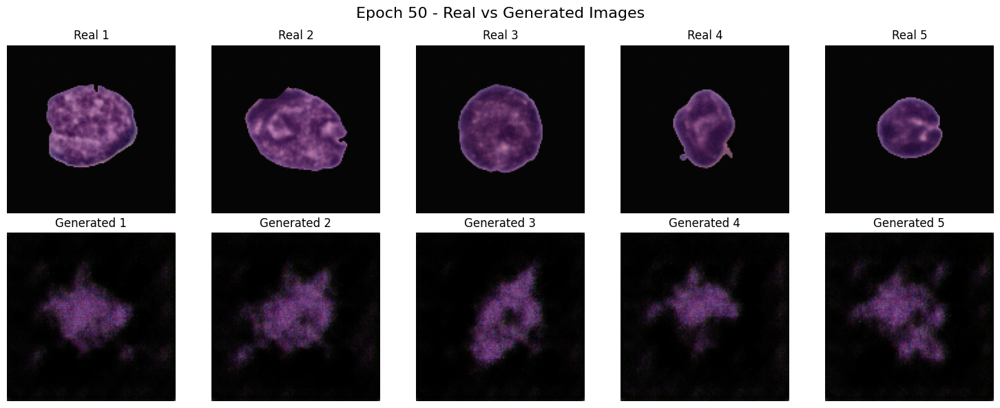

   51 |     -21.9050 |        42.0452 |   0.6144 |         21.9050
   52 |     -21.0843 |        43.2222 |   0.5113 |         21.0843
   53 |     -23.1391 |        37.0152 |   0.5959 |         23.1391
   54 |     -20.5062 |        39.5116 |   0.5378 |         20.5062
   55 |     -20.4851 |        40.0086 |   0.4970 |         20.4851
   56 |     -19.3590 |        56.3317 |   0.4804 |         19.3590
   57 |     -20.0287 |        34.5468 |   0.5291 |         20.0287
   58 |     -19.5297 |        56.3831 |   0.5691 |         19.5297
   59 |     -20.0578 |        40.9331 |   0.5230 |         20.0578
   60 |     -20.0125 |        50.8505 |   0.5778 |         20.0125
   61 |     -20.8549 |        36.0050 |   0.5811 |         20.8549
   62 |     -19.3377 |        45.1512 |   0.4995 |         19.3377
   63 |     -20.0719 |        51.9876 |   0.4898 |         20.0719
   64 |     -19.5369 |        40.0316 |   0.4792 |         19.5369
   65 |     -19.0666 |        45.7953 |   0.5013 |         19.

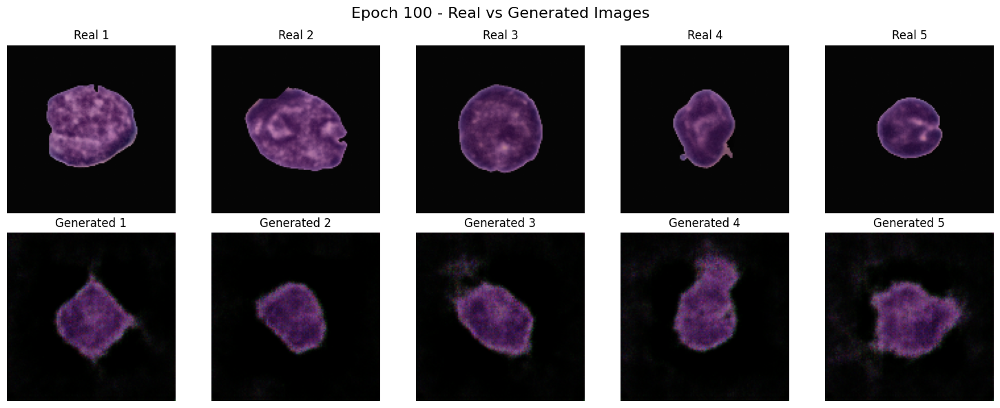

  101 |     -14.1802 |        99.4926 |   0.3165 |         14.1802
  102 |     -14.1928 |        97.4486 |   0.2886 |         14.1928
  103 |     -13.7002 |        87.7728 |   0.3065 |         13.7002
  104 |     -16.2780 |        77.7115 |   0.3920 |         16.2780
  105 |     -15.3575 |       108.5024 |   0.3167 |         15.3575
  106 |     -14.9243 |        92.8644 |   0.3191 |         14.9243
  107 |     -15.8970 |        88.3356 |   0.3309 |         15.8970
  108 |     -13.5599 |       100.8236 |   0.3061 |         13.5599
  109 |     -14.0488 |        94.0627 |   0.2880 |         14.0488
  110 |     -13.9355 |       110.7581 |   0.3348 |         13.9355
  111 |     -14.5647 |        87.0668 |   0.2634 |         14.5647
  112 |     -14.4637 |       100.0262 |   0.2960 |         14.4637
  113 |     -14.0160 |       102.6822 |   0.3472 |         14.0160
  114 |     -14.6259 |        99.2477 |   0.2878 |         14.6259
  115 |     -12.8938 |        97.6970 |   0.2977 |         12.

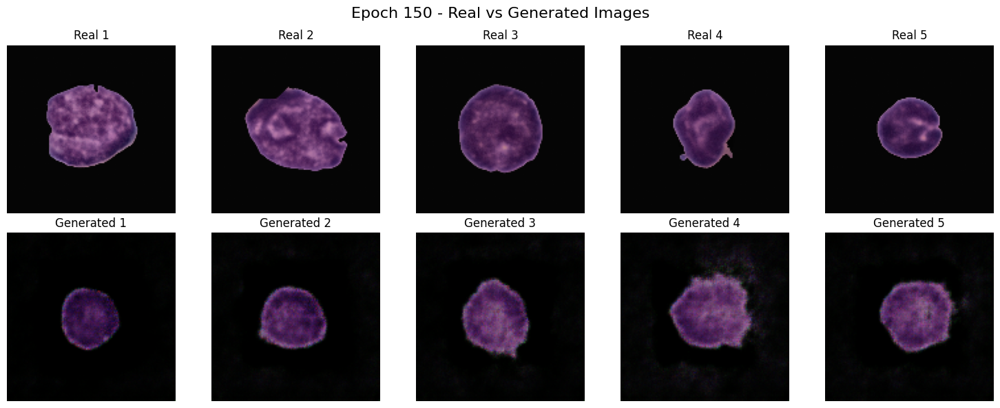

  151 |     -12.0607 |        84.9366 |   0.1786 |         12.0607
  152 |     -11.4836 |        93.8364 |   0.1954 |         11.4836
  153 |     -12.4974 |       109.1145 |   0.2202 |         12.4974
  154 |     -11.5166 |        90.2635 |   0.2280 |         11.5166
  155 |     -11.8411 |       106.9467 |   0.2165 |         11.8411
  156 |     -11.9206 |        99.0551 |   0.2078 |         11.9206
  157 |     -11.5051 |        88.6564 |   0.2572 |         11.5051
  158 |     -11.7644 |       114.2737 |   0.2291 |         11.7644
  159 |     -11.5891 |        93.6830 |   0.1701 |         11.5891
  160 |     -12.0021 |        90.0129 |   0.2308 |         12.0021
  161 |     -11.6214 |        99.9518 |   0.1949 |         11.6214
  162 |     -11.5779 |        90.5772 |   0.2217 |         11.5779
  163 |     -10.7806 |       104.7464 |   0.1795 |         10.7806
  164 |     -11.1438 |        92.4865 |   0.2085 |         11.1438
  165 |     -12.1586 |        87.5186 |   0.2002 |         12.

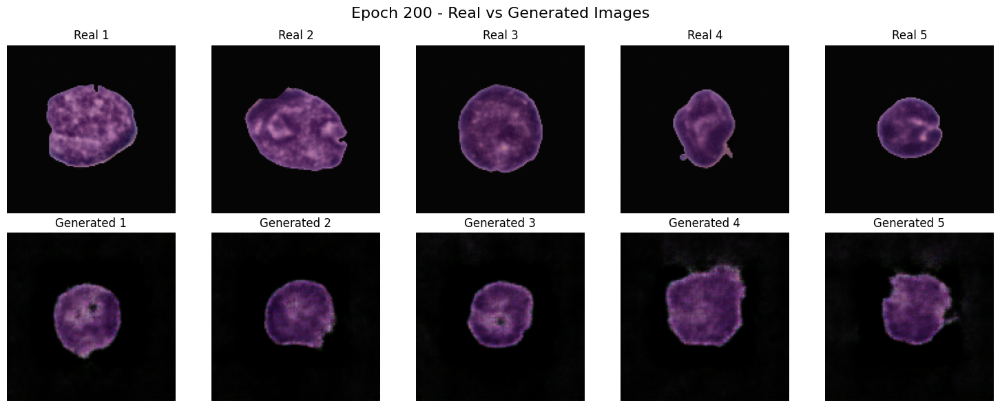

  201 |     -11.2943 |        62.6435 |   0.1690 |         11.2943
  202 |     -10.4062 |        96.5023 |   0.1718 |         10.4062
  203 |     -10.8816 |        87.4594 |   0.1712 |         10.8816
  204 |     -10.7888 |        79.2522 |   0.1851 |         10.7888
  205 |     -10.6711 |        85.7993 |   0.1749 |         10.6711
  206 |     -10.2593 |        82.3694 |   0.1916 |         10.2593
  207 |     -11.7449 |        75.8202 |   0.1806 |         11.7449
  208 |     -10.2975 |        91.0020 |   0.2004 |         10.2975
  209 |     -10.8787 |        92.7925 |   0.1621 |         10.8787
  210 |     -10.8973 |        66.8501 |   0.1680 |         10.8973
  211 |     -10.2696 |        71.5736 |   0.1799 |         10.2696
  212 |     -10.8699 |        93.8637 |   0.1627 |         10.8699
  213 |     -10.9993 |        58.2080 |   0.1947 |         10.9993
  214 |     -11.2219 |        72.3512 |   0.1728 |         11.2219
  215 |     -10.8115 |        78.4884 |   0.1849 |         10.

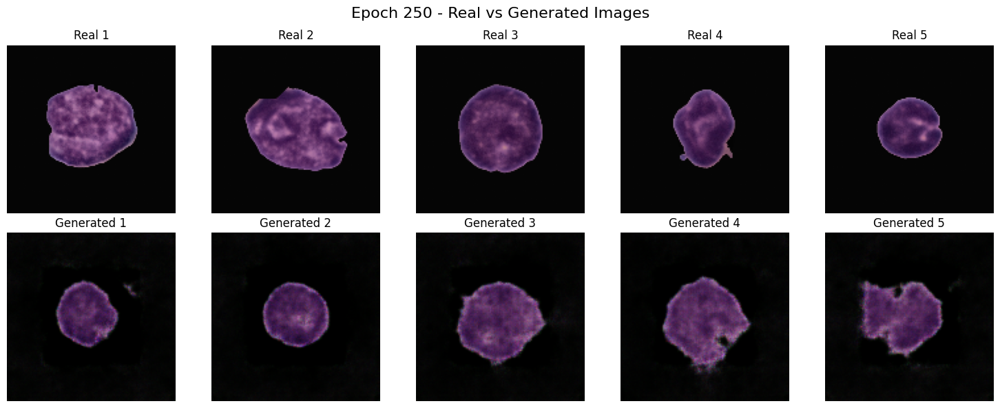

  251 |     -10.9067 |        53.9889 |   0.1953 |         10.9067
  252 |     -11.0675 |        69.4522 |   0.1417 |         11.0675
  253 |     -10.6215 |        43.8947 |   0.1780 |         10.6215
  254 |     -10.7205 |        75.2092 |   0.1853 |         10.7205
  255 |     -10.7059 |        56.9355 |   0.1930 |         10.7059
  256 |     -10.4941 |        59.9874 |   0.1685 |         10.4941
  257 |     -10.4451 |        63.5773 |   0.1862 |         10.4451
  258 |     -10.5634 |        58.2764 |   0.1684 |         10.5634
  259 |     -10.1947 |        61.1866 |   0.1423 |         10.1947
  260 |     -10.5722 |        56.9273 |   0.1658 |         10.5722
  261 |     -10.4414 |        53.4532 |   0.1808 |         10.4414
  262 |     -10.8819 |        55.6639 |   0.1982 |         10.8819
  263 |     -10.4840 |        59.1288 |   0.1745 |         10.4840
  264 |     -11.5556 |        59.4006 |   0.1687 |         11.5556
  265 |     -10.5684 |        35.9896 |   0.2094 |         10.

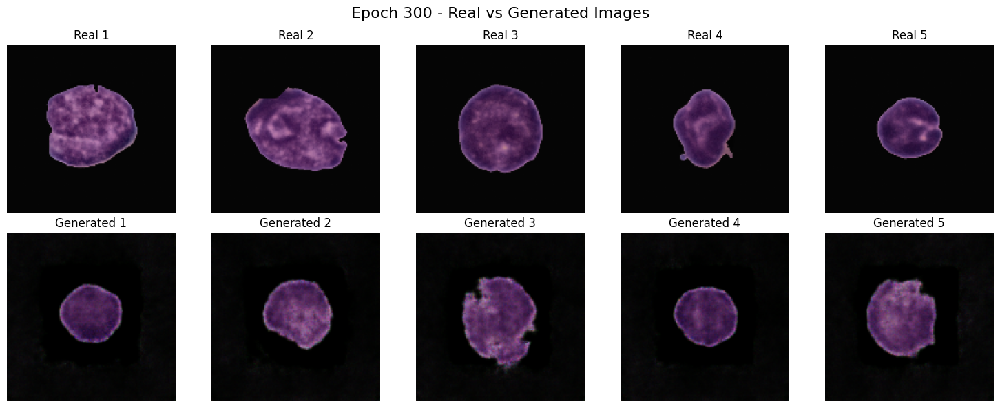

  301 |      -9.8732 |        52.4296 |   0.1480 |          9.8732
  302 |     -10.5133 |        50.4524 |   0.1615 |         10.5133
  303 |     -10.6466 |        47.7680 |   0.1677 |         10.6466
  304 |     -10.6204 |        54.7189 |   0.1730 |         10.6204
  305 |     -10.9914 |        45.2212 |   0.1770 |         10.9914
  306 |     -10.4743 |        51.1587 |   0.1975 |         10.4743
  307 |     -11.5379 |        64.8251 |   0.1673 |         11.5379
  308 |     -11.2253 |        44.7169 |   0.1674 |         11.2253
  309 |     -11.1643 |        57.5081 |   0.1802 |         11.1643
  310 |     -10.7390 |        46.6469 |   0.1812 |         10.7390
  311 |     -10.4715 |        48.3343 |   0.1680 |         10.4715
  312 |     -11.3003 |        53.2029 |   0.1941 |         11.3003
  313 |     -10.5641 |        58.0805 |   0.1493 |         10.5641
  314 |     -10.9084 |        43.6624 |   0.2089 |         10.9084
  315 |     -11.1036 |        53.3592 |   0.1526 |         11.

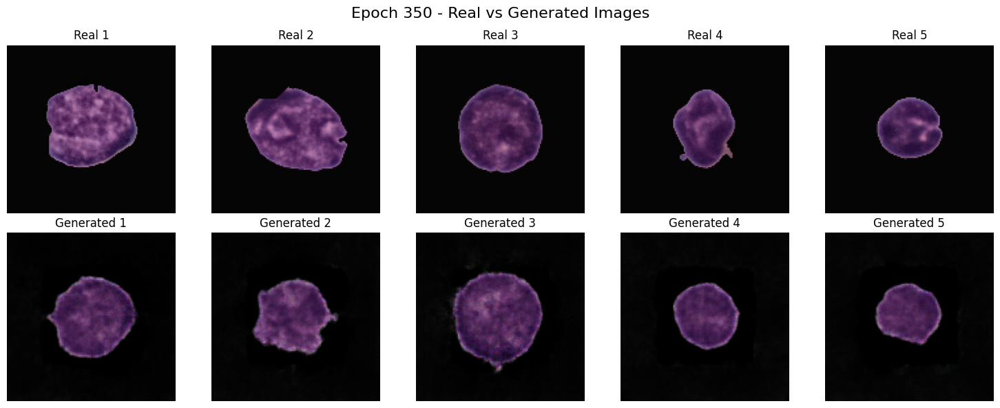

  351 |     -11.1449 |        50.9204 |   0.1995 |         11.1449
  352 |     -11.3750 |        35.5106 |   0.1794 |         11.3750
  353 |     -12.5810 |        42.5780 |   0.2019 |         12.5810
  354 |     -10.9226 |        33.8211 |   0.1910 |         10.9226
  355 |     -10.9242 |        50.9706 |   0.1649 |         10.9242
  356 |     -10.1667 |        37.8444 |   0.1514 |         10.1667
  357 |     -11.5404 |        39.1653 |   0.2009 |         11.5404
  358 |     -11.0532 |        46.4622 |   0.1457 |         11.0532
  359 |     -11.6145 |        38.0983 |   0.1710 |         11.6145
  360 |     -10.8749 |        38.7110 |   0.1795 |         10.8749
  361 |     -11.3134 |        46.5154 |   0.1878 |         11.3134
  362 |     -10.4243 |        40.5311 |   0.1852 |         10.4243
  363 |     -11.4536 |        41.9924 |   0.2032 |         11.4536
  364 |     -10.9858 |        46.3410 |   0.1372 |         10.9858
  365 |     -10.6518 |        37.4179 |   0.1714 |         10.

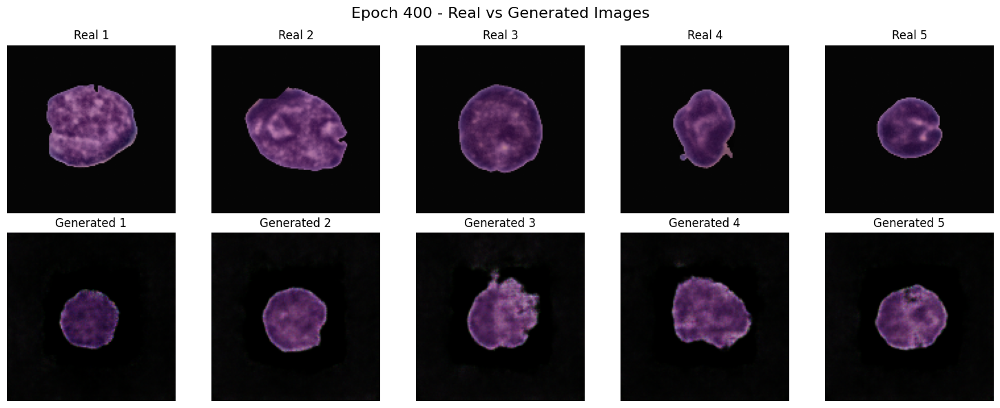

  401 |     -10.9697 |        45.2020 |   0.1708 |         10.9697
  402 |     -11.3346 |        47.7234 |   0.1609 |         11.3346
  403 |     -11.4981 |        42.4444 |   0.1868 |         11.4981
  404 |     -11.9440 |        45.2464 |   0.2183 |         11.9440
  405 |     -10.9241 |        51.5336 |   0.1700 |         10.9241
  406 |     -10.6539 |        39.8461 |   0.1512 |         10.6539
  407 |     -10.8579 |        44.0043 |   0.1817 |         10.8579
  408 |     -11.4066 |        49.4670 |   0.1821 |         11.4066
  409 |     -10.9942 |        37.7904 |   0.1742 |         10.9942
  410 |     -12.1476 |        44.2324 |   0.1868 |         12.1476
  411 |     -10.8590 |        35.3626 |   0.1638 |         10.8590
  412 |     -11.2842 |        44.4489 |   0.1895 |         11.2842
  413 |     -11.7033 |        51.0392 |   0.1731 |         11.7033
  414 |     -11.5030 |        31.8773 |   0.1509 |         11.5030
  415 |     -11.1636 |        43.5591 |   0.1880 |         11.

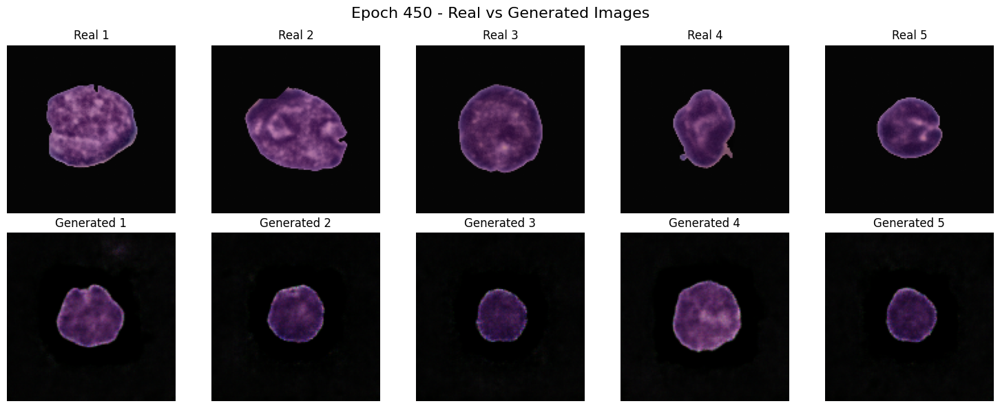

  451 |     -11.1905 |        41.7762 |   0.1650 |         11.1905
  452 |     -11.7616 |        42.5096 |   0.1713 |         11.7616
  453 |     -11.4740 |        43.4086 |   0.1839 |         11.4740
  454 |     -11.4819 |        39.4963 |   0.1606 |         11.4819
  455 |     -11.6165 |        45.6454 |   0.1881 |         11.6165
  456 |     -11.8186 |        41.8864 |   0.1789 |         11.8186
  457 |     -13.0987 |        39.0353 |   0.2562 |         13.0987
  458 |     -12.4117 |        50.4474 |   0.2075 |         12.4117
  459 |     -11.5162 |        42.1320 |   0.1737 |         11.5162
  460 |     -11.5787 |        38.2318 |   0.1755 |         11.5787
  461 |     -11.3206 |        45.8823 |   0.1756 |         11.3206
  462 |     -11.5809 |        35.7717 |   0.1941 |         11.5809
  463 |     -11.6529 |        44.2637 |   0.1854 |         11.6529
  464 |     -11.4084 |        45.4634 |   0.1948 |         11.4084
  465 |     -12.0156 |        41.9100 |   0.1866 |         12.

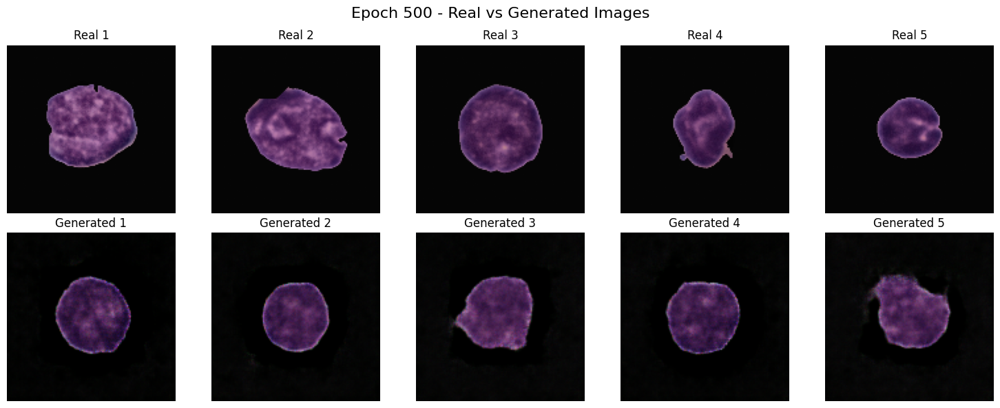

  501 |     -11.3084 |        33.0271 |   0.1980 |         11.3084
  502 |     -12.5352 |        44.8673 |   0.2037 |         12.5352
  503 |     -12.0947 |        37.1057 |   0.1884 |         12.0947
  504 |     -12.1608 |        37.2605 |   0.2332 |         12.1608
  505 |     -12.3819 |        41.2559 |   0.1640 |         12.3819
  506 |     -12.2352 |        34.5473 |   0.2037 |         12.2352
  507 |     -12.1558 |        40.9599 |   0.1773 |         12.1558
  508 |     -11.8163 |        35.6373 |   0.1909 |         11.8163
  509 |     -12.0133 |        44.0776 |   0.2028 |         12.0133
  510 |     -12.2243 |        31.9452 |   0.2100 |         12.2243
  511 |     -12.2538 |        47.3382 |   0.2251 |         12.2538
  512 |     -11.8641 |        33.0302 |   0.2037 |         11.8641
  513 |     -12.2403 |        41.4495 |   0.2059 |         12.2403
  514 |     -12.7804 |        39.8744 |   0.2026 |         12.7804
  515 |     -11.7679 |        35.2741 |   0.2100 |         11.

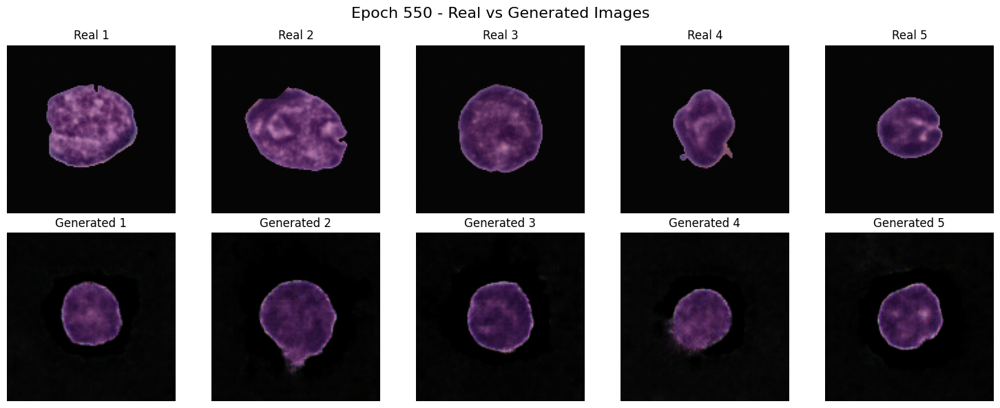

  551 |     -12.3180 |        37.9804 |   0.2135 |         12.3180
  552 |     -12.4593 |        35.4749 |   0.2071 |         12.4593
  553 |     -12.1799 |        37.2392 |   0.2151 |         12.1799
  554 |     -12.5977 |        35.4444 |   0.2321 |         12.5977
  555 |     -12.7432 |        41.6143 |   0.2467 |         12.7432
  556 |     -12.7733 |        32.2407 |   0.2377 |         12.7733
  557 |     -12.8507 |        41.7146 |   0.2058 |         12.8507
  558 |     -12.5935 |        36.7587 |   0.2059 |         12.5935
  559 |     -12.0882 |        35.1815 |   0.2027 |         12.0882
  560 |     -13.0296 |        37.2437 |   0.2097 |         13.0296
  561 |     -12.6497 |        35.2881 |   0.2249 |         12.6497
  562 |     -12.7477 |        38.3773 |   0.2358 |         12.7477
  563 |     -12.5050 |        35.2536 |   0.2229 |         12.5050
  564 |     -12.6721 |        37.3794 |   0.2055 |         12.6721
  565 |     -12.6005 |        35.1915 |   0.2032 |         12.

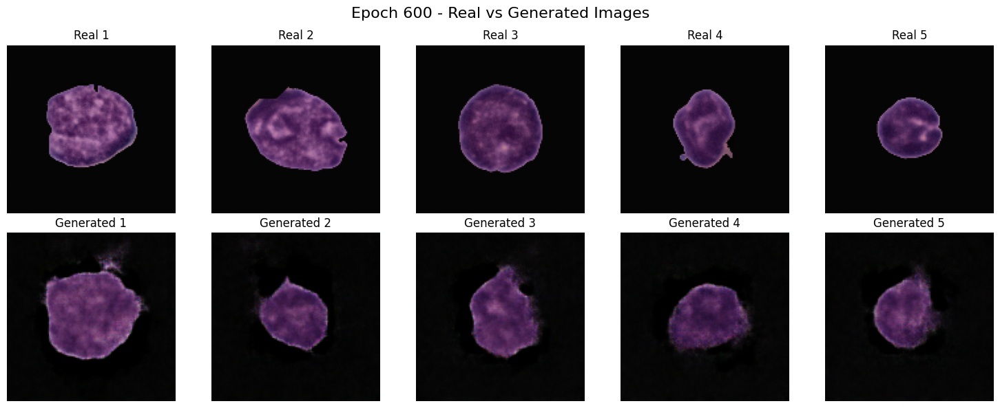

  601 |     -13.4988 |        35.8974 |   0.2095 |         13.4988
  602 |     -13.0193 |        31.4058 |   0.2544 |         13.0193
  603 |     -13.9523 |        34.6037 |   0.2710 |         13.9523
  604 |     -13.0453 |        34.6803 |   0.2233 |         13.0453
  605 |     -13.1458 |        36.6464 |   0.2291 |         13.1458
  606 |     -13.9759 |        31.1257 |   0.2228 |         13.9759
  607 |     -13.3274 |        34.2536 |   0.2340 |         13.3274
  608 |     -12.7554 |        35.7038 |   0.2548 |         12.7554
  609 |     -13.4717 |        31.6621 |   0.2177 |         13.4717
  610 |     -13.6930 |        31.3575 |   0.2591 |         13.6930
  611 |     -14.3366 |        37.0084 |   0.2482 |         14.3366
  612 |     -13.4640 |        28.6586 |   0.2759 |         13.4640
  613 |     -13.4983 |        36.2842 |   0.2389 |         13.4983
  614 |     -13.1101 |        30.3639 |   0.2608 |         13.1101
  615 |     -13.2728 |        31.9569 |   0.2451 |         13.

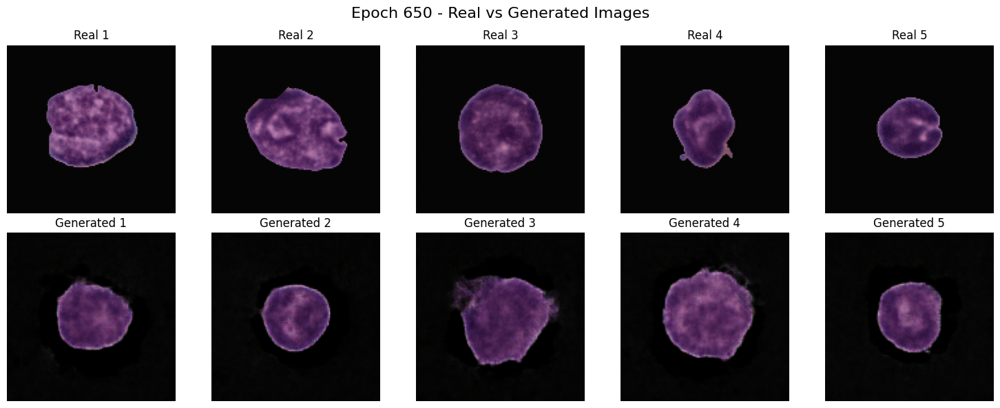

  651 |     -14.0160 |        32.5685 |   0.2697 |         14.0160
  652 |     -13.8481 |        32.7949 |   0.2875 |         13.8481
  653 |     -14.1814 |        33.7723 |   0.2649 |         14.1814
  654 |     -14.4034 |        29.9930 |   0.3031 |         14.4034
  655 |     -14.3516 |        31.1955 |   0.2936 |         14.3516
  656 |     -14.2932 |        32.9853 |   0.2580 |         14.2932
  657 |     -14.1596 |        35.1528 |   0.3312 |         14.1596
  658 |     -14.6875 |        28.8941 |   0.3126 |         14.6875
  659 |     -14.3143 |        33.3663 |   0.2859 |         14.3143
  660 |     -14.4983 |        32.5627 |   0.2646 |         14.4983
  661 |     -14.5807 |        30.8088 |   0.2736 |         14.5807
  662 |     -14.4859 |        31.6234 |   0.2925 |         14.4859
  663 |     -15.8561 |        34.3641 |   0.3327 |         15.8561
  664 |     -14.4255 |        31.2751 |   0.3406 |         14.4255
  665 |     -14.4264 |        33.1571 |   0.2680 |         14.

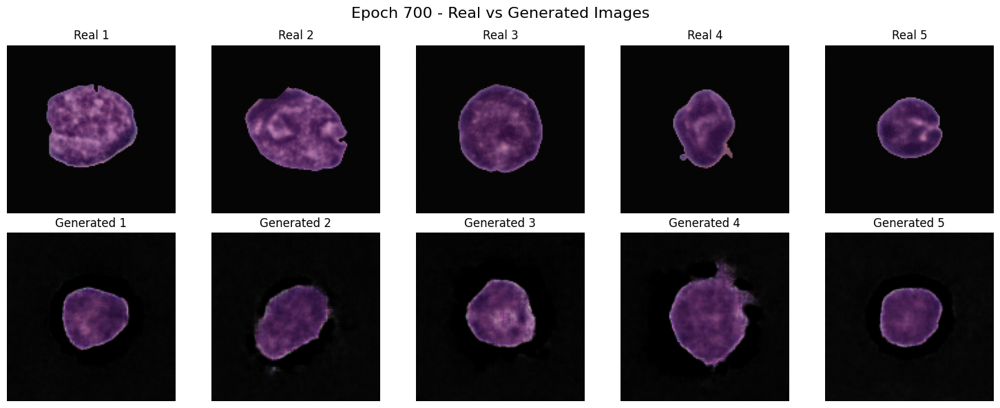

  701 |     -15.3739 |        31.0169 |   0.3171 |         15.3739
  702 |     -14.4104 |        30.8942 |   0.3144 |         14.4104
  703 |     -15.3076 |        26.3882 |   0.2888 |         15.3076
  704 |     -14.6279 |        28.9256 |   0.2890 |         14.6279
  705 |     -15.4667 |        28.6942 |   0.3170 |         15.4667
  706 |     -15.6830 |        26.3736 |   0.3566 |         15.6830
  707 |     -15.2707 |        29.4676 |   0.3305 |         15.2707
  708 |     -14.8847 |        27.7654 |   0.3098 |         14.8847
  709 |     -15.1308 |        28.9425 |   0.2825 |         15.1308
  710 |     -15.3394 |        28.2300 |   0.2939 |         15.3394
  711 |     -15.4035 |        26.8325 |   0.3275 |         15.4035
  712 |     -14.5438 |        28.3803 |   0.2933 |         14.5438
  713 |     -16.1041 |        26.6203 |   0.2722 |         16.1041
  714 |     -15.5505 |        25.2887 |   0.3754 |         15.5505
  715 |     -15.3573 |        27.8688 |   0.3478 |         15.

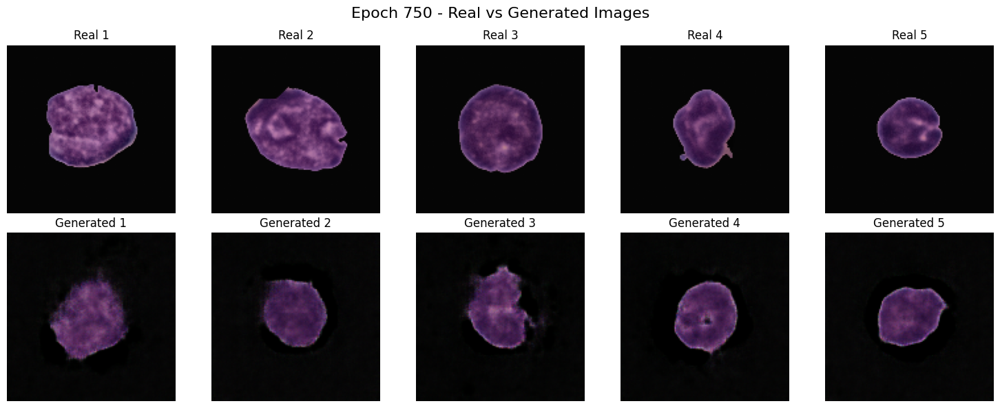

  751 |     -16.1203 |        24.9275 |   0.3523 |         16.1203
  752 |     -14.9301 |        25.6922 |   0.3173 |         14.9301
  753 |     -15.8464 |        24.9754 |   0.3605 |         15.8464
  754 |     -15.3139 |        24.1348 |   0.3378 |         15.3139
  755 |     -16.0598 |        24.3599 |   0.3327 |         16.0598
  756 |     -16.5681 |        25.0948 |   0.3935 |         16.5681
  757 |     -16.0144 |        24.7188 |   0.4034 |         16.0144
  758 |     -16.1598 |        27.8344 |   0.2966 |         16.1598
  759 |     -15.7921 |        24.2207 |   0.3333 |         15.7921
  760 |     -15.1466 |        25.1016 |   0.3692 |         15.1466
  761 |     -16.3933 |        23.2530 |   0.3422 |         16.3933
  762 |     -15.1975 |        25.5392 |   0.3321 |         15.1975
  763 |     -16.3808 |        25.6400 |   0.3865 |         16.3808
  764 |     -16.0133 |        25.8360 |   0.3305 |         16.0133
  765 |     -14.9541 |        23.2623 |   0.3466 |         14.

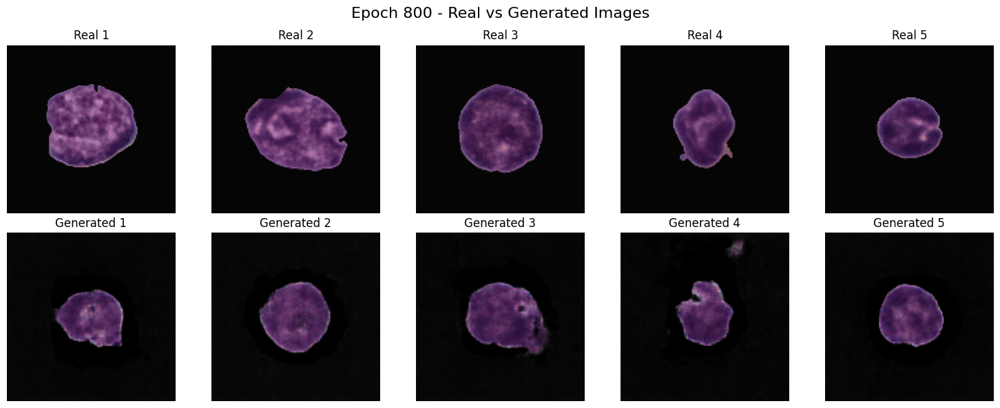

  801 |     -16.1718 |        22.1338 |   0.3687 |         16.1718
  802 |     -16.6956 |        25.8330 |   0.3708 |         16.6956
  803 |     -16.7286 |        24.0038 |   0.4275 |         16.7286
  804 |     -17.5066 |        23.8059 |   0.4432 |         17.5066
  805 |     -17.1706 |        23.2393 |   0.4338 |         17.1706
  806 |     -16.2071 |        26.5753 |   0.3632 |         16.2071
  807 |     -17.0442 |        22.5980 |   0.3930 |         17.0442
  808 |     -17.4888 |        22.8388 |   0.3686 |         17.4888
  809 |     -16.4905 |        23.9754 |   0.3597 |         16.4905
  810 |     -16.7278 |        22.7370 |   0.3932 |         16.7278
  811 |     -17.1217 |        23.5707 |   0.3791 |         17.1217
  812 |     -16.8391 |        22.9856 |   0.3664 |         16.8391
  813 |     -17.0251 |        22.6687 |   0.4289 |         17.0251
  814 |     -17.0826 |        23.6442 |   0.4685 |         17.0826
  815 |     -16.5819 |        23.9402 |   0.4297 |         16.

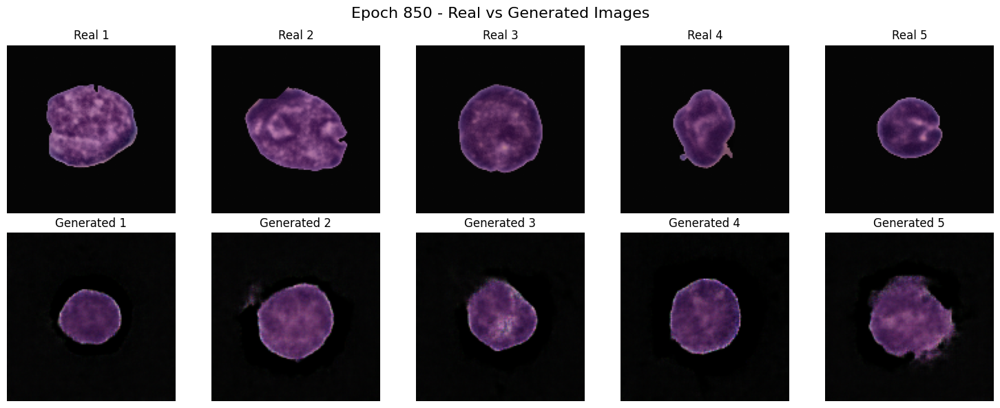

  851 |     -17.7416 |        21.1276 |   0.4442 |         17.7416
  852 |     -17.9199 |        20.4497 |   0.4752 |         17.9199
  853 |     -17.6160 |        20.5116 |   0.4546 |         17.6160
  854 |     -17.8398 |        19.5352 |   0.4199 |         17.8398
  855 |     -17.9047 |        23.5114 |   0.4919 |         17.9047
  856 |     -17.7810 |        20.3038 |   0.4800 |         17.7810
  857 |     -18.3505 |        21.8988 |   0.4238 |         18.3505
  858 |     -17.4010 |        19.0076 |   0.4578 |         17.4010
  859 |     -17.5751 |        22.1337 |   0.4114 |         17.5751
  860 |     -18.4681 |        19.4092 |   0.5017 |         18.4681
  861 |     -17.4792 |        21.8178 |   0.4123 |         17.4792
  862 |     -18.0622 |        19.3380 |   0.5008 |         18.0622
  863 |     -17.4048 |        20.9649 |   0.4347 |         17.4048
  864 |     -17.9069 |        20.8288 |   0.4118 |         17.9069
  865 |     -18.4276 |        21.8380 |   0.4495 |         18.

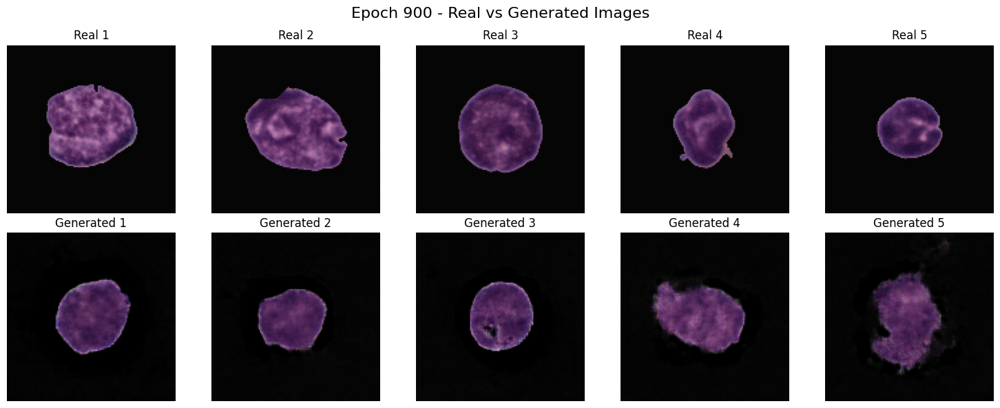

  901 |     -18.7438 |        20.8148 |   0.4379 |         18.7438
  902 |     -18.3837 |        19.3505 |   0.5094 |         18.3837
  903 |     -18.3563 |        22.1215 |   0.5294 |         18.3563
  904 |     -19.2053 |        20.5139 |   0.5092 |         19.2053
  905 |     -18.2726 |        19.4545 |   0.4597 |         18.2726
  906 |     -19.4234 |        19.7422 |   0.4839 |         19.4234
  907 |     -18.1878 |        20.7774 |   0.5019 |         18.1878
  908 |     -18.4539 |        20.8399 |   0.4913 |         18.4539
  909 |     -18.8873 |        20.2865 |   0.5023 |         18.8873
  910 |     -19.3826 |        18.4021 |   0.4809 |         19.3826
  911 |     -19.2481 |        19.7302 |   0.4877 |         19.2481
  912 |     -18.8169 |        18.4678 |   0.4557 |         18.8169
  913 |     -18.7942 |        21.1982 |   0.4983 |         18.7942
  914 |     -19.1321 |        19.1591 |   0.5035 |         19.1321
  915 |     -17.6842 |        21.6041 |   0.5137 |         17.

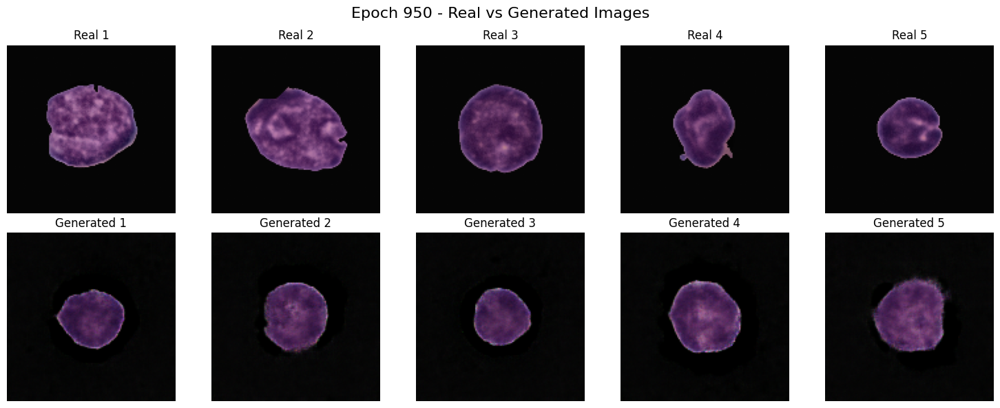

  951 |     -19.1135 |        19.0142 |   0.5452 |         19.1135
  952 |     -18.2787 |        18.7909 |   0.4791 |         18.2787
  953 |     -19.2844 |        19.0183 |   0.5455 |         19.2844
  954 |     -18.7222 |        20.4994 |   0.6543 |         18.7222
  955 |     -19.3297 |        20.0150 |   0.5218 |         19.3297
  956 |     -18.7299 |        19.7572 |   0.4970 |         18.7299
  957 |     -19.6305 |        19.0013 |   0.5597 |         19.6305
  958 |     -19.6989 |        20.6462 |   0.5375 |         19.6989
  959 |     -19.4036 |        18.2169 |   0.5246 |         19.4036
  960 |     -19.2835 |        18.8831 |   0.4331 |         19.2835
  961 |     -20.2552 |        20.2241 |   0.5409 |         20.2552
  962 |     -19.3255 |        19.8516 |   0.4952 |         19.3255
  963 |     -18.5661 |        19.3230 |   0.5363 |         18.5661
  964 |     -18.8628 |        19.2994 |   0.5401 |         18.8628
  965 |     -19.9014 |        19.2321 |   0.5971 |         19.

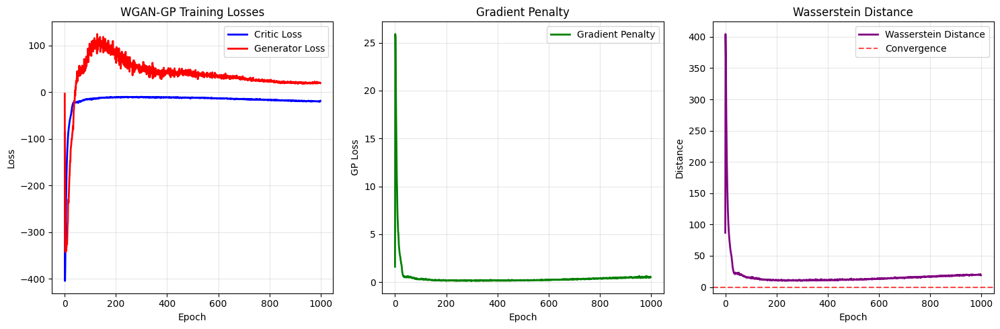


WGAN-GP TRAINING COMPLETED
Final Critic Loss: -18.8335
Final Generator Loss: 19.3904
Final Wasserstein Distance: 18.8335
Generating 2718 synthetic images using WGAN-GP...
Generating 2718 synthetic images...


100%|██████████| 85/85 [00:04<00:00, 19.05it/s]

Generated 2718 images in /content/synthetic_hem
Original dataset size: 7462
Synthetic HEM (Normal) images added: 2718
Balanced dataset size: 10180
GAN training completed.
Returning WGAN-GP generator and balanced dataset.
✓ Pipeline completed successfully!


TypeError: unsupported format string passed to numpy.ndarray.__format__

In [20]:
# =============================================================================
# EXECUTE MAIN PIPELINE
# =============================================================================
# Run the STABLE pipeline with WGAN-GP
print("Starting STABLE pipeline with WGAN-GP...")
print("WGAN-GP is proven to be much more stable than DCGAN!")
print("It doesn't use accuracy - it uses Wasserstein distance as a meaningful loss metric")
model, gan, accuracy = run_stable_pipeline(use_subset=True)

if model is not None:
    print(f"✓ Pipeline completed successfully!")
    print(f"✓ Final Model Accuracy: {accuracy:.4f}")

    if gan is not None:
        print("✓ WGAN-GP was successfully trained and used for data augmentation")
    else:
        print("✓ GAN was not needed or skipped")
else:
    print("✗ Pipeline failed to complete successfully.")

GPU available
Loaded 1000 synthetic HEM images.
Final dataset size: 11661
Training samples: 8162
Validation samples: 1749
Test samples: 1750


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch 1/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.85it/s]


Epoch 1: Train Loss=1.5157, Acc=0.7013, Valid Loss=0.4526, Acc=0.8096
Epoch 2/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.15it/s]


Epoch 2: Train Loss=0.4717, Acc=0.7964, Valid Loss=0.4104, Acc=0.8296
Epoch 3/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.74it/s]


Epoch 3: Train Loss=0.4506, Acc=0.8024, Valid Loss=0.4129, Acc=0.8308
Epoch 4/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.08it/s]


Epoch 4: Train Loss=0.4459, Acc=0.8087, Valid Loss=0.4401, Acc=0.8308
Epoch 5/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.77it/s]


Epoch 5: Train Loss=0.4357, Acc=0.8101, Valid Loss=0.3837, Acc=0.8496
Epoch 6/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.87it/s]


Epoch 6: Train Loss=0.4293, Acc=0.8138, Valid Loss=0.3799, Acc=0.8491
Epoch 7/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.72it/s]


Epoch 7: Train Loss=0.4080, Acc=0.8302, Valid Loss=0.4033, Acc=0.8290
Epoch 8/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.86it/s]


Epoch 8: Train Loss=0.4121, Acc=0.8277, Valid Loss=0.4048, Acc=0.8176
Epoch 9/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.66it/s]


Epoch 9: Train Loss=0.4040, Acc=0.8281, Valid Loss=0.3894, Acc=0.8348
Epoch 10/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.78it/s]


Epoch 10: Train Loss=0.3729, Acc=0.8464, Valid Loss=0.3538, Acc=0.8553
Epoch 11/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.65it/s]


Epoch 11: Train Loss=0.3625, Acc=0.8538, Valid Loss=0.3346, Acc=0.8651
Epoch 12/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.66it/s]


Epoch 12: Train Loss=0.3648, Acc=0.8511, Valid Loss=0.3217, Acc=0.8731
Epoch 13/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.88it/s]


Epoch 13: Train Loss=0.3508, Acc=0.8607, Valid Loss=0.3121, Acc=0.8805
Epoch 14/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.72it/s]


Epoch 14: Train Loss=0.3463, Acc=0.8589, Valid Loss=0.3109, Acc=0.8776
Epoch 15/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.01it/s]


Epoch 15: Train Loss=0.3388, Acc=0.8612, Valid Loss=0.3268, Acc=0.8685
Epoch 16/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.67it/s]


Epoch 16: Train Loss=0.3317, Acc=0.8667, Valid Loss=0.2983, Acc=0.8834
Epoch 17/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.89it/s]


Epoch 17: Train Loss=0.3311, Acc=0.8663, Valid Loss=0.3199, Acc=0.8742
Epoch 18/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.72it/s]


Epoch 18: Train Loss=0.3280, Acc=0.8689, Valid Loss=0.3104, Acc=0.8736
Epoch 19/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.83it/s]


Epoch 19: Train Loss=0.3341, Acc=0.8671, Valid Loss=0.3044, Acc=0.8834
Epoch 20/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.70it/s]


Epoch 20: Train Loss=0.3054, Acc=0.8793, Valid Loss=0.2958, Acc=0.8816
Epoch 21/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.66it/s]


Epoch 21: Train Loss=0.3033, Acc=0.8807, Valid Loss=0.2758, Acc=0.8925
Epoch 22/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.13it/s]


Epoch 22: Train Loss=0.2898, Acc=0.8851, Valid Loss=0.2835, Acc=0.8908
Epoch 23/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.73it/s]


Epoch 23: Train Loss=0.2848, Acc=0.8896, Valid Loss=0.2788, Acc=0.8954
Epoch 24/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.13it/s]


Epoch 24: Train Loss=0.2910, Acc=0.8854, Valid Loss=0.2782, Acc=0.8971
Epoch 25/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.80it/s]


Epoch 25: Train Loss=0.2805, Acc=0.8929, Valid Loss=0.2685, Acc=0.8982
Epoch 26/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.83it/s]


Epoch 26: Train Loss=0.2748, Acc=0.8954, Valid Loss=0.2660, Acc=0.8999
Epoch 27/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.89it/s]


Epoch 27: Train Loss=0.2703, Acc=0.8967, Valid Loss=0.2632, Acc=0.9022
Epoch 28/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.79it/s]


Epoch 28: Train Loss=0.2746, Acc=0.8995, Valid Loss=0.2769, Acc=0.8908
Epoch 29/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.03it/s]


Epoch 29: Train Loss=0.2589, Acc=0.9022, Valid Loss=0.2481, Acc=0.9125
Epoch 30/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.77it/s]


Epoch 30: Train Loss=0.2626, Acc=0.9020, Valid Loss=0.3140, Acc=0.8742
Epoch 31/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.06it/s]


Epoch 31: Train Loss=0.2596, Acc=0.9006, Valid Loss=0.3134, Acc=0.8725
Epoch 32/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.80it/s]


Epoch 32: Train Loss=0.2606, Acc=0.8995, Valid Loss=0.2651, Acc=0.9022
Epoch 33/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.85it/s]


Epoch 33: Train Loss=0.2540, Acc=0.9064, Valid Loss=0.2779, Acc=0.8937
Epoch 34/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.83it/s]


Epoch 34: Train Loss=0.2429, Acc=0.9103, Valid Loss=0.2421, Acc=0.9085
Epoch 35/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.82it/s]


Epoch 35: Train Loss=0.2454, Acc=0.9090, Valid Loss=0.2400, Acc=0.9108
Epoch 36/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.09it/s]


Epoch 36: Train Loss=0.2392, Acc=0.9117, Valid Loss=0.2772, Acc=0.8931
Epoch 37/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.78it/s]


Epoch 37: Train Loss=0.2407, Acc=0.9097, Valid Loss=0.2416, Acc=0.9119
Epoch 38/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.86it/s]


Epoch 38: Train Loss=0.2332, Acc=0.9113, Valid Loss=0.2494, Acc=0.9108
Epoch 39/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.87it/s]


Epoch 39: Train Loss=0.2275, Acc=0.9169, Valid Loss=0.2384, Acc=0.9125
Epoch 40/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.74it/s]


Epoch 40: Train Loss=0.2303, Acc=0.9161, Valid Loss=0.2411, Acc=0.9079


100%|██████████| 55/55 [00:11<00:00,  4.65it/s]



Classification Report:
               precision    recall  f1-score   support

         ALL       0.92      0.96      0.94      1091
         HEM       0.92      0.86      0.89       659

    accuracy                           0.92      1750
   macro avg       0.92      0.91      0.91      1750
weighted avg       0.92      0.92      0.92      1750

Precision=0.9217, Recall=0.8574, F1=0.8884


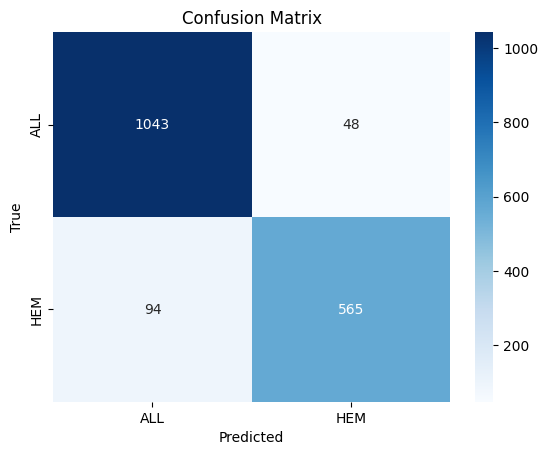

In [21]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, f1_score
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from tqdm import tqdm

_checked_for_gpu = False

# ===========================
# Load real data
# ===========================
def create_df(dataset):
    image_paths, labels = [], []

    for dirpath, dirnames, filenames in os.walk(dataset):
        for filename in filenames:
            image = os.path.join(dirpath, filename)
            image_paths.append(image)
            if dirpath.endswith("all"):
                labels.append("all")
            else:
                labels.append("hem")

    df = pd.DataFrame({
        "Image Path": image_paths,
        "Label": labels
    })
    return df

# ===========================
# Add synthetic HEM images
# ===========================
def load_synthetic_hem(synthetic_dir, max_count=1000):

    synthetic_files = glob.glob(os.path.join(synthetic_dir, "*.bmp"))
    synthetic_files = synthetic_files[:max_count]   # Take first 1000

    if len(synthetic_files) == 0:
        print("No synthetic HEM images found.")
        return pd.DataFrame(columns=["Image Path", "Label"])

    df_syn = pd.DataFrame({
        "Image Path": synthetic_files,
        "Label": ["hem"] * len(synthetic_files)
    })

    print(f"Loaded {len(df_syn)} synthetic HEM images.")
    return df_syn

# ===========================
# Dataset Class
# ===========================
class LeukemiaDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
        self.label_dict = {"all": 0, "hem": 1}

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.iloc[idx]["Image Path"]
        label = self.label_dict[self.df.iloc[idx]["Label"]]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# ===========================
# Transforms
# ===========================
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ===========================
# VGG16 Model
# ===========================
def create_model():
    base = models.vgg16(weights=None)
    base = base.features

    model = nn.Sequential(
        base,
        nn.AdaptiveAvgPool2d((7, 7)),
        nn.Flatten(),
        nn.Dropout(0.5),
        nn.Linear(512 * 7 * 7, 256),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(256, 2)
    )
    return model

# ===========================
# GPU Check
# ===========================
def check_gpu():
    global _checked_for_gpu
    if not _checked_for_gpu:
        _checked_for_gpu = True
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        print("GPU available" if torch.cuda.is_available() else "Using CPU")
        return device
    return None

device = check_gpu()
if device is None:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ===========================
# Load Original DF
# ===========================
train_dir = "/content/data/C-NMC_Leukemia/training_data"
df_real = create_df(train_dir)

# ===========================
# Load Synthetic HEM
# ===========================
synthetic_dir = "/content/synthetic_hem"
df_syn = load_synthetic_hem(synthetic_dir, max_count=1000)

# ===========================
# Combine real + synthetic
# ===========================
df = pd.concat([df_real, df_syn], ignore_index=True)
print("Final dataset size:", len(df))

# ===========================
# Train/Valid/Test Split
# ===========================
train_df, remaining_df = train_test_split(df, train_size=0.7, shuffle=True,
                                          random_state=31, stratify=df["Label"])

valid_df, test_df = train_test_split(remaining_df, train_size=0.5, shuffle=True,
                                     random_state=31, stratify=remaining_df["Label"])

print("Training samples:", len(train_df))
print("Validation samples:", len(valid_df))
print("Test samples:", len(test_df))

# ===========================
# DataLoaders
# ===========================
batch_size = 32
num_workers = 4

train_dataset = LeukemiaDataset(train_df, transform=train_transform)
valid_dataset = LeukemiaDataset(valid_df, transform=test_transform)
test_dataset = LeukemiaDataset(test_df, transform=test_transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

# ===========================
# Model + Loss + Optimizer
# ===========================
model = create_model().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adamax(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=2)

# ===========================
# Training Loop
# ===========================
epochs = 40
train_losses = []
valid_losses = []
train_accuracies = []
valid_accuracies = []
best_valid_loss = float("inf")

for epoch in range(epochs):
    # -------- TRAIN --------
    model.train()
    total, correct, running_loss = 0, 0, 0

    print(f"Epoch {epoch+1}/{epochs} - Training...")
    for images, labels in tqdm(train_loader):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = correct / total

    train_losses.append(train_loss)
    train_accuracies.append(train_acc)

    # -------- VALIDATION --------
    model.eval()
    total, correct, running_loss = 0, 0, 0

    with torch.no_grad():
        for images, labels in tqdm(valid_loader):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    valid_loss = running_loss / len(valid_loader)
    valid_acc = correct / total

    valid_losses.append(valid_loss)
    valid_accuracies.append(valid_acc)

    scheduler.step(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), "best_vgg16_model.pth")

    print(f"Epoch {epoch+1}: Train Loss={train_loss:.4f}, Acc={train_acc:.4f}, "
          f"Valid Loss={valid_loss:.4f}, Acc={valid_acc:.4f}")

# ===========================
# Evaluate on Test Set
# ===========================
model.load_state_dict(torch.load("best_vgg16_model.pth"))
model.eval()

y_true, y_pred = [], []

with torch.no_grad():
    for images, labels in tqdm(test_loader):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())

precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
print("\nClassification Report:\n", classification_report(
    y_true, y_pred, target_names=["ALL", "HEM"]
))
print(f"Precision={precision:.4f}, Recall={recall:.4f}, F1={f1:.4f}")

cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["ALL", "HEM"], yticklabels=["ALL", "HEM"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


In [22]:
from google.colab import files
import shutil

shutil.make_archive("synthetic_hem", "zip", "/content/synthetic_hem")
files.download("synthetic_hem.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Evaluating: 100%|██████████| 55/55 [00:15<00:00,  3.66it/s]


Accuracy: 0.9189
Precision: 0.9217
Recall:    0.8574
F1 Score:  0.8884

Classification Report:
               precision    recall  f1-score   support

         ALL       0.92      0.96      0.94      1091
         HEM       0.92      0.86      0.89       659

    accuracy                           0.92      1750
   macro avg       0.92      0.91      0.91      1750
weighted avg       0.92      0.92      0.92      1750



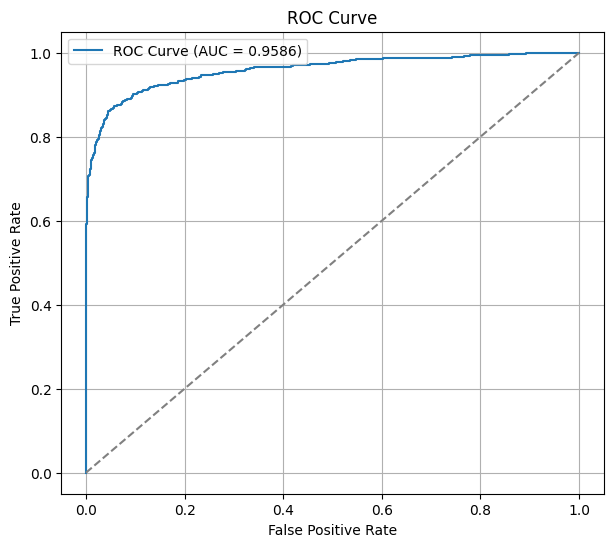

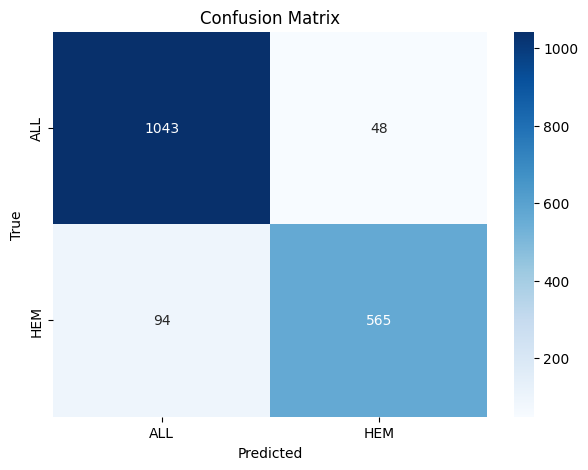

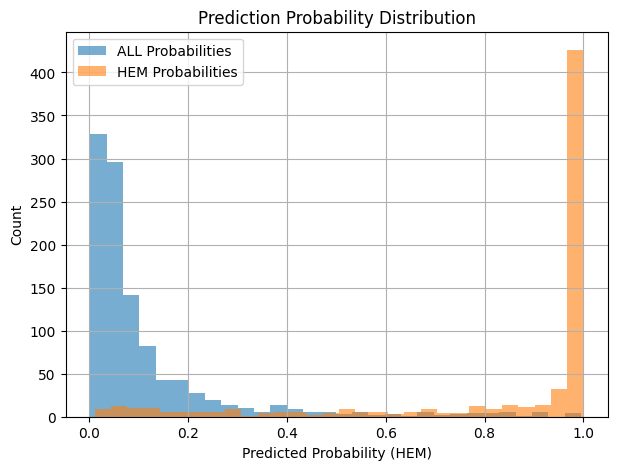

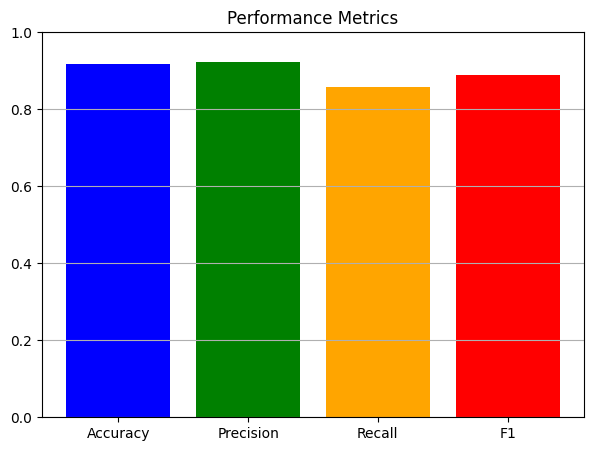

In [24]:
import torch
import torch.nn as nn
from tqdm import tqdm
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    precision_score,
    recall_score,
    f1_score,
    roc_curve,
    auc,
    accuracy_score
)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# =====================================================
# Reload VGG16 model architecture
# =====================================================
def create_model():
    base = models.vgg16(weights=None)
    base = base.features
    model = nn.Sequential(
        base,
        nn.AdaptiveAvgPool2d((7, 7)),
        nn.Flatten(),
        nn.Dropout(0.5),
        nn.Linear(512 * 7 * 7, 256),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(256, 2)
    )
    return model

# =====================================================
# Load trained model
# =====================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = create_model().to(device)
model.load_state_dict(torch.load("best_vgg16_model.pth", map_location=device))
model.eval()

# =====================================================
# Recreate test dataset and loader
# =====================================================
test_dataset = LeukemiaDataset(test_df, transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# =====================================================
# Evaluate model
# =====================================================
y_true, y_pred = [], []
y_probs = []

with torch.no_grad():
    for images, labels in tqdm(test_loader, desc="Evaluating"):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        probs = torch.softmax(outputs, dim=1)[:, 1]

        _, predicted = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())
        y_probs.extend(probs.cpu().numpy())

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_probs = np.array(y_probs)

# =====================================================
# Metrics
# =====================================================
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")

print("\nClassification Report:\n",
      classification_report(y_true, y_pred, target_names=["ALL", "HEM"])
)

# =====================================================
# ROC Curve and AUC
# =====================================================
fpr, tpr, thresholds = roc_curve(y_true, y_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(7, 6))
plt.plot(fpr, tpr, linestyle='-', label=f"ROC Curve (AUC = {roc_auc:.4f})")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid()
plt.show()

# =====================================================
# Confusion Matrix
# =====================================================
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(7, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["ALL", "HEM"], yticklabels=["ALL", "HEM"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# =====================================================
# Probability Distribution Plot
# =====================================================
plt.figure(figsize=(7, 5))
plt.hist(y_probs[y_true == 0], bins=30, alpha=0.6, label="ALL Probabilities")
plt.hist(y_probs[y_true == 1], bins=30, alpha=0.6, label="HEM Probabilities")
plt.xlabel("Predicted Probability (HEM)")
plt.ylabel("Count")
plt.title("Prediction Probability Distribution")
plt.legend()
plt.grid()
plt.show()

# =====================================================
# Accuracy, Precision, Recall, F1 Bar Plot
# =====================================================
plt.figure(figsize=(7, 5))
metrics = [accuracy, precision, recall, f1]
names = ["Accuracy", "Precision", "Recall", "F1"]

plt.bar(names, metrics, color=["blue", "green", "orange", "red"])
plt.ylim(0, 1)
plt.title("Performance Metrics")
plt.grid(axis="y")
plt.show()



GPU available
Loaded 1000 synthetic HEM images.
Final dataset size: 11661
Training samples: 8162
Validation samples: 1749
Test samples: 1750


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Epoch 1/40 - Training...


100%|██████████| 55/55 [00:09<00:00,  5.52it/s]


Epoch 1: Train Loss=0.4752, Acc=0.7864, Valid Loss=0.5172, Acc=0.7593
Epoch 2/40 - Training...


100%|██████████| 55/55 [00:09<00:00,  5.54it/s]


Epoch 2: Train Loss=0.4100, Acc=0.8301, Valid Loss=0.5175, Acc=0.7965
Epoch 3/40 - Training...


100%|██████████| 55/55 [00:11<00:00,  4.87it/s]


Epoch 3: Train Loss=0.3742, Acc=0.8484, Valid Loss=0.4727, Acc=0.7885
Epoch 4/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.31it/s]


Epoch 4: Train Loss=0.3533, Acc=0.8549, Valid Loss=0.3402, Acc=0.8639
Epoch 5/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.33it/s]


Epoch 5: Train Loss=0.3343, Acc=0.8627, Valid Loss=0.3016, Acc=0.8828
Epoch 6/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.30it/s]


Epoch 6: Train Loss=0.3213, Acc=0.8738, Valid Loss=0.3179, Acc=0.8742
Epoch 7/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.36it/s]


Epoch 7: Train Loss=0.3000, Acc=0.8813, Valid Loss=0.3807, Acc=0.8342
Epoch 8/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.35it/s]


Epoch 8: Train Loss=0.2835, Acc=0.8911, Valid Loss=0.2634, Acc=0.9057
Epoch 9/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.29it/s]


Epoch 9: Train Loss=0.2644, Acc=0.8954, Valid Loss=0.3159, Acc=0.8651
Epoch 10/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.29it/s]


Epoch 10: Train Loss=0.2628, Acc=0.8966, Valid Loss=0.2745, Acc=0.8977
Epoch 11/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.26it/s]


Epoch 11: Train Loss=0.2495, Acc=0.9075, Valid Loss=0.2044, Acc=0.9228
Epoch 12/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.31it/s]


Epoch 12: Train Loss=0.2442, Acc=0.9055, Valid Loss=0.2121, Acc=0.9205
Epoch 13/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.37it/s]


Epoch 13: Train Loss=0.2238, Acc=0.9147, Valid Loss=0.2080, Acc=0.9240
Epoch 14/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.24it/s]


Epoch 14: Train Loss=0.2164, Acc=0.9174, Valid Loss=0.1988, Acc=0.9245
Epoch 15/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.30it/s]


Epoch 15: Train Loss=0.2107, Acc=0.9202, Valid Loss=0.8940, Acc=0.7593
Epoch 16/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.33it/s]


Epoch 16: Train Loss=0.2085, Acc=0.9226, Valid Loss=0.2199, Acc=0.9131
Epoch 17/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.31it/s]


Epoch 17: Train Loss=0.2058, Acc=0.9199, Valid Loss=0.8899, Acc=0.7301
Epoch 18/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.32it/s]


Epoch 18: Train Loss=0.1926, Acc=0.9264, Valid Loss=0.1689, Acc=0.9388
Epoch 19/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.32it/s]


Epoch 19: Train Loss=0.1852, Acc=0.9282, Valid Loss=0.1597, Acc=0.9365
Epoch 20/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.29it/s]


Epoch 20: Train Loss=0.1810, Acc=0.9298, Valid Loss=0.5145, Acc=0.7953
Epoch 21/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.32it/s]


Epoch 21: Train Loss=0.1814, Acc=0.9302, Valid Loss=0.2095, Acc=0.9217
Epoch 22/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.32it/s]


Epoch 22: Train Loss=0.1786, Acc=0.9376, Valid Loss=0.1731, Acc=0.9342
Epoch 23/40 - Training...


100%|██████████| 55/55 [00:09<00:00,  5.56it/s]


Epoch 23: Train Loss=0.1618, Acc=0.9417, Valid Loss=0.1511, Acc=0.9405
Epoch 24/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.43it/s]


Epoch 24: Train Loss=0.1510, Acc=0.9429, Valid Loss=0.1900, Acc=0.9245
Epoch 25/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.43it/s]


Epoch 25: Train Loss=0.1508, Acc=0.9434, Valid Loss=0.1892, Acc=0.9257
Epoch 26/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.45it/s]


Epoch 26: Train Loss=0.1494, Acc=0.9427, Valid Loss=0.1935, Acc=0.9211
Epoch 27/40 - Training...


100%|██████████| 55/55 [00:09<00:00,  5.56it/s]


Epoch 27: Train Loss=0.1461, Acc=0.9456, Valid Loss=0.2053, Acc=0.9194
Epoch 28/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.37it/s]


Epoch 28: Train Loss=0.1482, Acc=0.9452, Valid Loss=0.1654, Acc=0.9394
Epoch 29/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.29it/s]


Epoch 29: Train Loss=0.1387, Acc=0.9463, Valid Loss=0.2169, Acc=0.9205
Epoch 30/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.33it/s]


Epoch 30: Train Loss=0.1428, Acc=0.9476, Valid Loss=0.1707, Acc=0.9365
Epoch 31/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.33it/s]


Epoch 31: Train Loss=0.1384, Acc=0.9488, Valid Loss=0.1830, Acc=0.9302
Epoch 32/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.22it/s]


Epoch 32: Train Loss=0.1337, Acc=0.9501, Valid Loss=0.2181, Acc=0.9217
Epoch 33/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.20it/s]


Epoch 33: Train Loss=0.1288, Acc=0.9510, Valid Loss=0.1985, Acc=0.9245
Epoch 34/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.27it/s]


Epoch 34: Train Loss=0.1400, Acc=0.9496, Valid Loss=0.1740, Acc=0.9360
Epoch 35/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.27it/s]


Epoch 35: Train Loss=0.1376, Acc=0.9466, Valid Loss=0.2052, Acc=0.9268
Epoch 36/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.31it/s]


Epoch 36: Train Loss=0.1302, Acc=0.9496, Valid Loss=0.1854, Acc=0.9325
Epoch 37/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.21it/s]


Epoch 37: Train Loss=0.1295, Acc=0.9510, Valid Loss=0.2135, Acc=0.9200
Epoch 38/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.17it/s]


Epoch 38: Train Loss=0.1459, Acc=0.9496, Valid Loss=0.4851, Acc=0.8228
Epoch 39/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.26it/s]


Epoch 39: Train Loss=0.1292, Acc=0.9543, Valid Loss=0.1896, Acc=0.9308
Epoch 40/40 - Training...


100%|██████████| 55/55 [00:10<00:00,  5.14it/s]


Epoch 40: Train Loss=0.1309, Acc=0.9534, Valid Loss=0.1858, Acc=0.9325


100%|██████████| 55/55 [00:09<00:00,  5.52it/s]



Classification Report:
               precision    recall  f1-score   support

         ALL       0.94      0.97      0.95      1091
         HEM       0.94      0.90      0.92       659

    accuracy                           0.94      1750
   macro avg       0.94      0.93      0.94      1750
weighted avg       0.94      0.94      0.94      1750

Precision=0.9401, Recall=0.9044, F1=0.9219


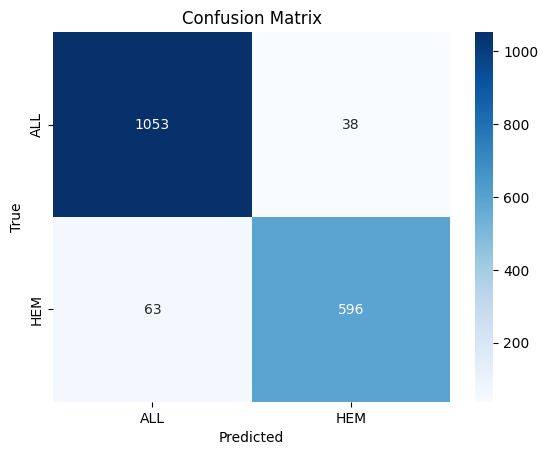

In [26]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, f1_score
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from tqdm import tqdm

_checked_for_gpu = False

# ===========================
# Load real data
# ===========================
def create_df(dataset):
    image_paths, labels = [], []

    for dirpath, dirnames, filenames in os.walk(dataset):
        for filename in filenames:
            image = os.path.join(dirpath, filename)
            image_paths.append(image)

            if dirpath.endswith("all"):
                labels.append("all")
            else:
                labels.append("hem")

    df = pd.DataFrame({
        "Image Path": image_paths,
        "Label": labels
    })
    return df

# ===========================
# Load synthetic HEM images
# ===========================
def load_synthetic_hem(synthetic_dir, max_count=1000):

    synthetic_files = glob.glob(os.path.join(synthetic_dir, "*.bmp"))
    synthetic_files = synthetic_files[:max_count]

    if len(synthetic_files) == 0:
        print("No synthetic HEM images found.")
        return pd.DataFrame(columns=["Image Path", "Label"])

    df_syn = pd.DataFrame({
        "Image Path": synthetic_files,
        "Label": ["hem"] * len(synthetic_files)
    })

    print(f"Loaded {len(df_syn)} synthetic HEM images.")
    return df_syn

# ===========================
# Dataset Class
# ===========================
class LeukemiaDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
        self.label_dict = {"all": 0, "hem": 1}

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.iloc[idx]["Image Path"]
        label = self.label_dict[self.df.iloc[idx]["Label"]]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# ===========================
# Transforms
# ===========================
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ===========================
# EfficientNet-B0 Model
# ===========================
def create_model():
    base = models.efficientnet_b0(weights=None)
    feature_extractor = base.features

    model = nn.Sequential(
        feature_extractor,
        nn.AdaptiveAvgPool2d((1, 1)),
        nn.Flatten(),
        nn.Dropout(0.5),
        nn.Linear(1280, 256),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(256, 2)
    )

    return model

# ===========================
# GPU Check
# ===========================
def check_gpu():
    global _checked_for_gpu
    if not _checked_for_gpu:
        _checked_for_gpu = True
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        print("GPU available" if torch.cuda.is_available() else "Using CPU")
        return device
    return None

device = check_gpu()
if device is None:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ===========================
# Load Original Data
# ===========================
train_dir = "/content/data/C-NMC_Leukemia/training_data"
df_real = create_df(train_dir)

# ===========================
# Load Synthetic HEM
# ===========================
synthetic_dir = "/content/synthetic_hem"
df_syn = load_synthetic_hem(synthetic_dir, max_count=1000)

# ===========================
# Combine real + synthetic
# ===========================
df = pd.concat([df_real, df_syn], ignore_index=True)
print("Final dataset size:", len(df))

# ===========================
# Split dataset
# ===========================
train_df, remaining_df = train_test_split(df, train_size=0.7, shuffle=True,
                                          random_state=31, stratify=df["Label"])

valid_df, test_df = train_test_split(remaining_df, train_size=0.5, shuffle=True,
                                     random_state=31, stratify=remaining_df["Label"])

print("Training samples:", len(train_df))
print("Validation samples:", len(valid_df))
print("Test samples:", len(test_df))

# ===========================
# Dataloaders
# ===========================
batch_size = 32
num_workers = 4

train_dataset = LeukemiaDataset(train_df, transform=train_transform)
valid_dataset = LeukemiaDataset(valid_df, transform=test_transform)
test_dataset = LeukemiaDataset(test_df, transform=test_transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

# ===========================
# Model + Loss + Optimizer
# ===========================
model = create_model().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adamax(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=2)

# ===========================
# Training Loop
# ===========================
epochs = 40
train_losses = []
valid_losses = []
train_accuracies = []
valid_accuracies = []
best_valid_loss = float("inf")

for epoch in range(epochs):
    # TRAIN
    model.train()
    total, correct, running_loss = 0, 0, 0

    print(f"Epoch {epoch+1}/{epochs} - Training...")
    for images, labels in tqdm(train_loader):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = correct / total

    train_losses.append(train_loss)
    train_accuracies.append(train_acc)

    # VALIDATION
    model.eval()
    total, correct, running_loss = 0, 0, 0

    with torch.no_grad():
        for images, labels in tqdm(valid_loader):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    valid_loss = running_loss / len(valid_loader)
    valid_acc = correct / total

    valid_losses.append(valid_loss)
    valid_accuracies.append(valid_acc)

    scheduler.step(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), "best_efficientnet_model.pth")

    print(f"Epoch {epoch+1}: Train Loss={train_loss:.4f}, Acc={train_acc:.4f}, "
          f"Valid Loss={valid_loss:.4f}, Acc={valid_acc:.4f}")

# ===========================
# Evaluate on Test Set
# ===========================
model.load_state_dict(torch.load("best_efficientnet_model.pth"))
model.eval()

y_true, y_pred = [], []

with torch.no_grad():
    for images, labels in tqdm(test_loader):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())

precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

print("\nClassification Report:\n",
      classification_report(y_true, y_pred, target_names=["ALL", "HEM"]))

print(f"Precision={precision:.4f}, Recall={recall:.4f}, F1={f1:.4f}")

cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["ALL", "HEM"], yticklabels=["ALL", "HEM"])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


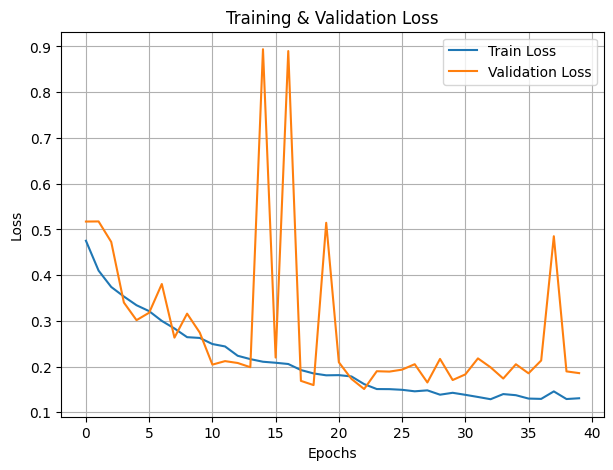

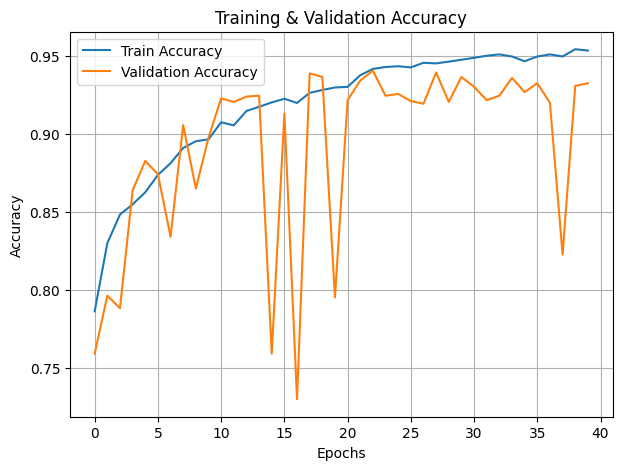

Evaluation With Probabilities:   0%|          | 0/55 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Evaluation With Probabilities: 100%|██████████| 55/55 [00:13<00:00,  4.06it/s]


==== METRICS ====
Accuracy: 0.9422857142857143
Precision: 0.9400630914826499
Recall: 0.9044006069802731
F1: 0.9218870843000774


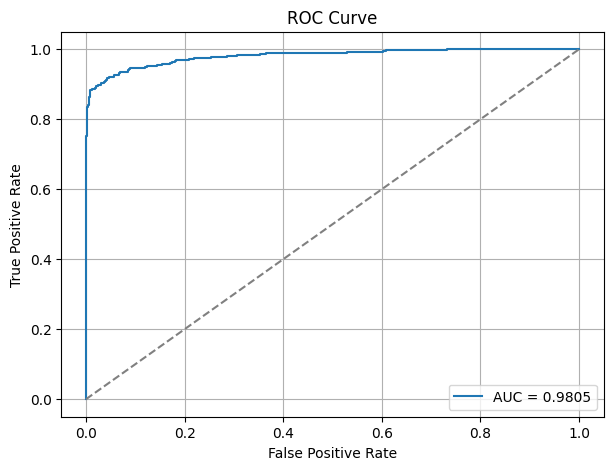

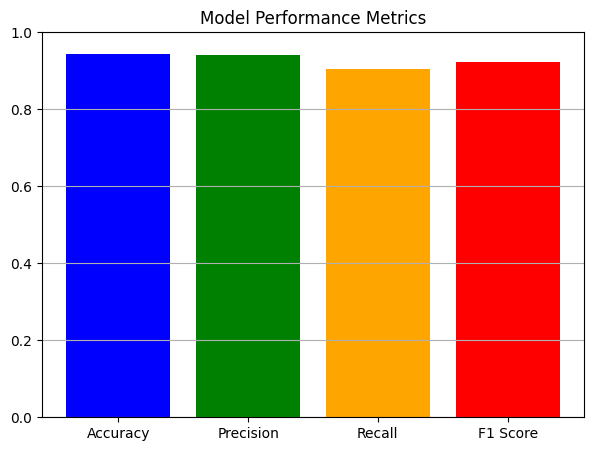

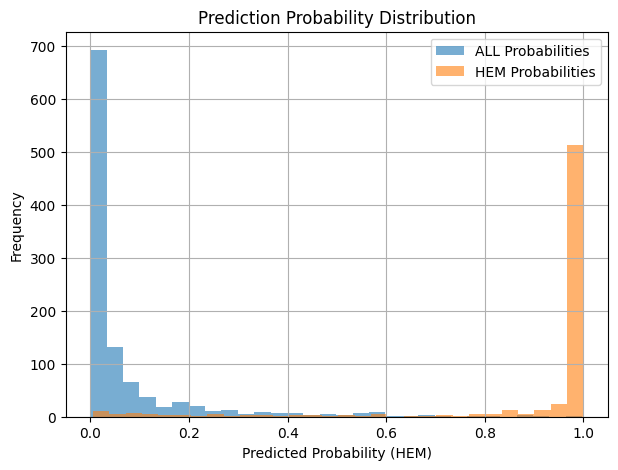

In [27]:
# ============================================================
# TRAINING CURVES (LOSS & ACCURACY)
# ============================================================

# ----- Loss Curve -----
plt.figure(figsize=(7,5))
plt.plot(train_losses, label="Train Loss")
plt.plot(valid_losses, label="Validation Loss")
plt.title("Training & Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.show()

# ----- Accuracy Curve -----
plt.figure(figsize=(7,5))
plt.plot(train_accuracies, label="Train Accuracy")
plt.plot(valid_accuracies, label="Validation Accuracy")
plt.title("Training & Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()


# ============================================================
# ADVANCED METRICS: ROC, AUC, PRECISION, RECALL, PROB CURVE
# ============================================================

# Re-run predictions with probabilities for ROC
y_true = []
y_pred = []
y_probs = []

model.eval()
with torch.no_grad():
    for images, labels in tqdm(test_loader, desc="Evaluation With Probabilities"):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        probs = torch.softmax(outputs, dim=1)[:, 1]

        _, predicted = torch.max(outputs, 1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())
        y_probs.extend(probs.cpu().numpy())

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_probs = np.array(y_probs)

# Metrics
accuracy = (y_pred == y_true).mean()
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

print("\n==== METRICS ====")
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1:", f1)

# ============================================================
# ROC CURVE
# ============================================================
from sklearn.metrics import roc_curve, auc

fpr, tpr, _ = roc_curve(y_true, y_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(7,5))
plt.plot(fpr, tpr, label="AUC = %.4f" % roc_auc)
plt.plot([0,1], [0,1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid()
plt.show()

# ============================================================
# PRECISION / RECALL / F1 / ACCURACY BAR CHART
# ============================================================
plt.figure(figsize=(7,5))
metrics = [accuracy, precision, recall, f1]
labels = ["Accuracy", "Precision", "Recall", "F1 Score"]

plt.bar(labels, metrics, color=["blue", "green", "orange", "red"])
plt.title("Model Performance Metrics")
plt.ylim(0, 1)
plt.grid(axis="y")
plt.show()

# ============================================================
# PROBABILITY DISTRIBUTION PLOTS
# ============================================================
plt.figure(figsize=(7,5))
plt.hist(y_probs[y_true == 0], bins=30, alpha=0.6, label="ALL Probabilities")
plt.hist(y_probs[y_true == 1], bins=30, alpha=0.6, label="HEM Probabilities")
plt.xlabel("Predicted Probability (HEM)")
plt.ylabel("Frequency")
plt.title("Prediction Probability Distribution")
plt.legend()
plt.grid()
plt.show()
